In [ ]:
%pip install copent

In [ ]:
%pip install GPy

Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 0.0/1.6 MB ? eta -:--:--
     -- ------------------------------------- 0.1/1.6 MB 1.7 MB/s eta 0:00:01
     ------- -------------------------------- 0.3/1.6 MB 3.2 MB/s eta 0:00:01
     ----------------- ---------------------- 0.7/1.6 MB 5.0 MB/s eta 0:00:01
     ---------------------------------------  1.6/1.6 MB 8.7 MB/s eta 0:00:01
     ---------------------------------------- 1.6/1.6 MB 8.0 MB/s eta 0:00:00
     ---------------------------------------- 0.0/103.2 kB ? eta -:--:--
     -------------------------------------- 103.2/103.2 kB 5.8 MB/s eta 0:00:00



[notice] A new release of pip is available: 23.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
import GPy
import warnings
warnings.filterwarnings('ignore')

import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, grangercausalitytests
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.api import VAR
from copent import transent

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split, ParameterGrid
from sklearn.gaussian_process import GaussianProcessRegressor

import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, LSTM, Embedding
from keras.callbacks import EarlyStopping, LearningRateScheduler
from keras.losses import MeanSquaredError, Huber
from keras.optimizers import Adam
from keras.metrics import MeanAbsoluteError

import torch
from torch import nn, optim

from itertools import product
import pickle as pkl
from tqdm.notebook import tqdm

%matplotlib inline

In [ ]:
strategy = tf.distribute.MirroredStrategy()

## Import data and preprocessing

In [4]:
data = pd.read_csv('/kaggle/input/weather-data-munich-1954-2022/weatherdata.csv', sep=';')
data.columns = data.columns.str.strip()
data.head()

,STATIONS_ID,MESS_DATUM,QN_3,FX,FM,QN_4,RSK,RSKF,SDK,SHK_TAG,NM,VPM,PM,TMK,UPM,TXK,TNK,TGK,eor
0,3379,19540601,-999,-999.0,-999.0,1,0.0,1,-999.0,0,-999.0,-999.0,-999.0,14.0,-999.0,17.6,10.4,-999.0,eor
1,3379,19540602,-999,-999.0,-999.0,1,0.5,1,-999.0,0,-999.0,-999.0,-999.0,13.2,-999.0,19.7,9.7,-999.0,eor
2,3379,19540603,-999,-999.0,-999.0,1,0.0,1,-999.0,0,-999.0,-999.0,-999.0,16.6,-999.0,21.9,8.2,-999.0,eor
3,3379,19540604,-999,-999.0,-999.0,1,1.2,1,-999.0,0,-999.0,-999.0,-999.0,15.2,-999.0,17.3,11.8,-999.0,eor
4,3379,19540605,-999,-999.0,-999.0,1,6.0,1,-999.0,0,-999.0,-999.0,-999.0,15.2,-999.0,17.7,13.7,-999.0,eor


In [5]:
data['MESS_DATUM'] = data['MESS_DATUM'].astype(str)
data['MESS_DATUM'] = data['MESS_DATUM'].apply(lambda x: x[-2:] + '/' +  x[-4:-2] + '/' + x[:4])
data['MESS_DATUM'] = pd.to_datetime(data['MESS_DATUM'], format="%d/%m/%Y")
data['MESS_DATUM'].head()

0   1954-06-01
1   1954-06-02
2   1954-06-03
3   1954-06-04
4   1954-06-05
Name: MESS_DATUM, dtype: datetime64[ns]

In [6]:
data.describe()

,STATIONS_ID,MESS_DATUM,QN_3,FX,FM,QN_4,RSK,RSKF,SDK,SHK_TAG,NM,VPM,PM,TMK,UPM,TXK,TNK,TGK
count,25051.0,25051,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000
mean,3379.0,1988-09-15 00:00:00,-440.069458,-443.776775,-446.922051,5.661530,2.627951,2.686679,-7.370731,-61.539899,-443.378979,-440.455842,83.229992,9.612083,-405.123415,13.828729,5.658369,-443.437691
min,3379.0,1954-06-01 00:00:00,-999.000000,-999.000000,-999.000000,1.000000,0.000000,0.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-20.000000,-999.000000,-17.900000,-25.400000,-999.000000
25%,3379.0,1971-07-24 12:00:00,-999.000000,-999.000000,-999.000000,1.000000,0.000000,0.000000,0.400000,0.000000,-999.000000,-999.000000,-999.000000,3.400000,-999.000000,6.700000,0.500000,-999.000000
50%,3379.0,1988-09-15 00:00:00,10.000000,4.900000,1.200000,9.000000,0.000000,1.000000,3.900000,0.000000,1.300000,4.700000,945.000000,9.900000,54.000000,14.200000,5.900000,-4.200000
75%,3379.0,2005-11-07 12:00:00,10.000000,8.900000,2.400000,10.000000,2.600000,6.000000,8.300000,0.000000,6.200000,9.500000,956.400000,15.800000,76.000000,20.900000,11.400000,6.200000
max,3379.0,2022-12-31 00:00:00,10.000000,38.600000,11.000000,10.000000,101.600000,8.000000,15.717000,55.000000,8.000000,21.500000,979.600000,30.400000,100.000000,37.500000,22.600000,21.400000
std,0.0,NaN,501.479739,501.633240,498.138980,4.318503,5.911350,2.880991,110.177292,242.190168,499.278507,501.344036,971.398000,7.908055,533.140985,9.013736,7.036732,499.129425


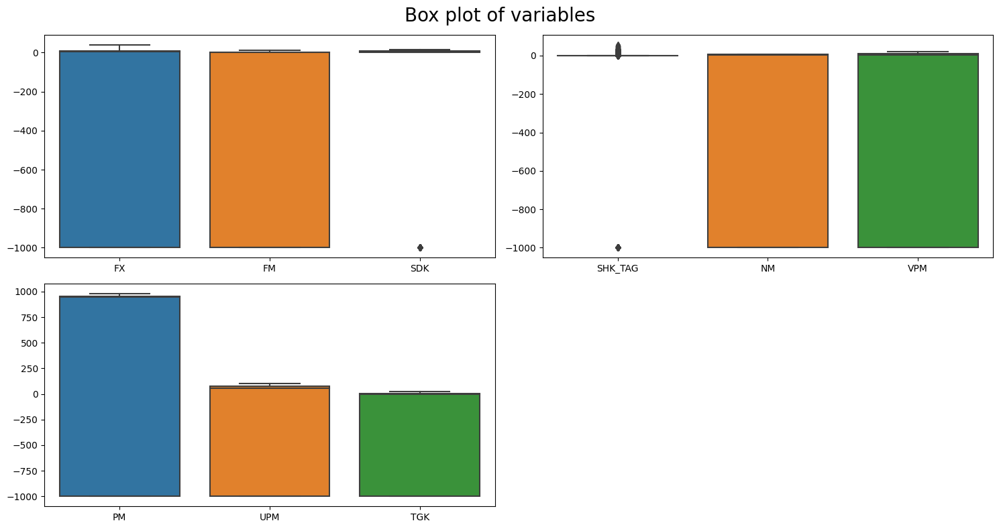

In [7]:
plt.figure(figsize=(15, 8))
plt.suptitle('Box plot of variables', fontsize=20)

plt.subplot(2, 2, 1)
sns.boxplot(data[['FX', 'FM', 'SDK']])

plt.subplot(2, 2, 2)
sns.boxplot(data[['SHK_TAG', 'NM', 'VPM']])

plt.subplot(2, 2, 3)
sns.boxplot(data[['PM', 'UPM', 'TGK']])

plt.tight_layout()
plt.show()

In [8]:
data['FM'].replace(-999, -1, inplace=True)
data['PM'].replace(-999, -1, inplace=True)
data['VPM'].replace(-999, -1, inplace=True)
data['UPM'].replace(-999, -1, inplace=True)
data['FX'].replace(-999, -1, inplace=True)
data['SDK'].replace(-999, -1, inplace=True)
data['NM'].replace(-999, -1, inplace=True)
data['TGK'].replace(-999, -1, inplace=True)

data.drop(columns=['QN_3', 'SHK_TAG', 'STATIONS_ID', 'QN_4', 'RSK', 'RSKF', 'eor'], inplace=True)

data.describe()

,MESS_DATUM,FX,FM,SDK,NM,VPM,PM,TMK,UPM,TXK,TNK,TGK
count,25051,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000
mean,1988-09-15 00:00:00,4.727636,0.944940,4.780082,2.456237,4.821632,528.507466,9.612083,40.154059,13.828729,5.658369,2.278009
min,1954-06-01 00:00:00,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-20.000000,-1.000000,-17.900000,-25.400000,-23.500000
25%,1971-07-24 12:00:00,-1.000000,-1.000000,0.400000,-1.000000,-1.000000,-1.000000,3.400000,-1.000000,6.700000,0.500000,-1.000000
50%,1988-09-15 00:00:00,4.900000,1.200000,3.900000,1.300000,4.700000,945.000000,9.900000,54.000000,14.200000,5.900000,-1.000000
75%,2005-11-07 12:00:00,8.900000,2.400000,8.300000,6.200000,9.500000,956.400000,15.800000,76.000000,20.900000,11.400000,6.200000
max,2022-12-31 00:00:00,38.600000,11.000000,15.717000,8.000000,21.500000,979.600000,30.400000,100.000000,37.500000,22.600000,21.400000
std,NaN,6.076875,1.993331,4.383838,3.570336,6.036319,475.305209,7.908055,38.251542,9.013736,7.036732,6.027918


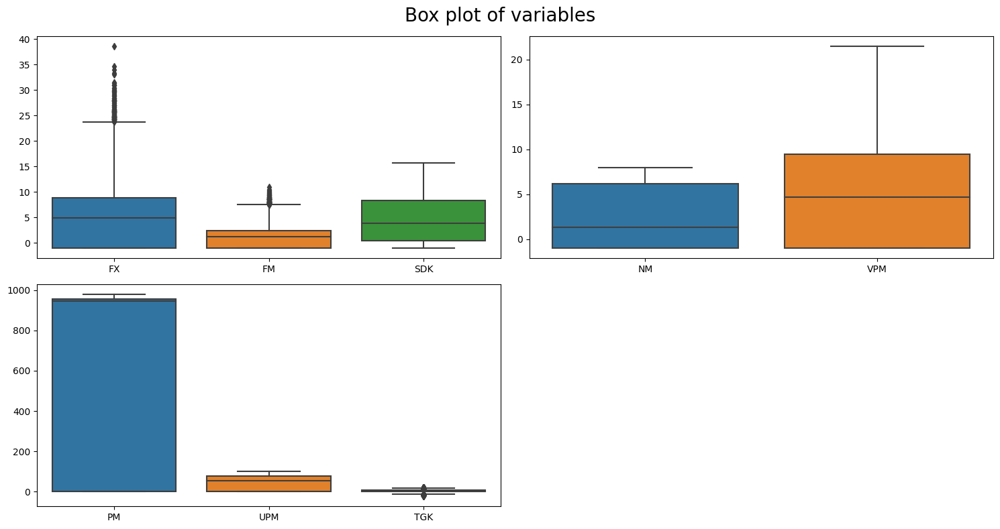

In [9]:
plt.figure(figsize=(15, 8))
plt.suptitle('Box plot of variables', fontsize=20)

plt.subplot(2, 2, 1)
sns.boxplot(data[['FX', 'FM', 'SDK']])

plt.subplot(2, 2, 2)
sns.boxplot(data[['NM', 'VPM']])

plt.subplot(2, 2, 3)
sns.boxplot(data[['PM', 'UPM', 'TGK']])

plt.tight_layout()
plt.show()

In [10]:
#data.to_csv('weather.csv')

In [11]:
df_2020 = data[data['MESS_DATUM'] >= '01/01/2018'].reset_index(drop=True)

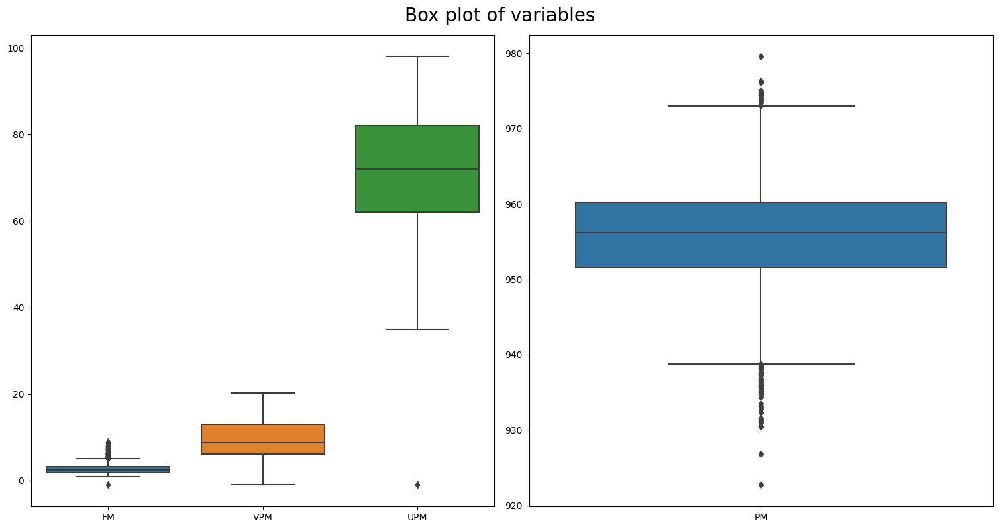

In [12]:
plt.figure(figsize=(15, 8))
plt.suptitle('Box plot of variables', fontsize=20)

plt.subplot(1, 2, 1)
sns.boxplot(df_2020[['FM', 'VPM', 'UPM']])

plt.subplot(1, 2, 2)
sns.boxplot(df_2020[['PM']])

plt.tight_layout()
plt.show()

## Data visualization

In [13]:
def plot_ts(data, label):
    sns.lineplot(data=data, x='MESS_DATUM', y=label)
    plt.title(label)
    plt.ylabel('')
    plt.xlabel('')

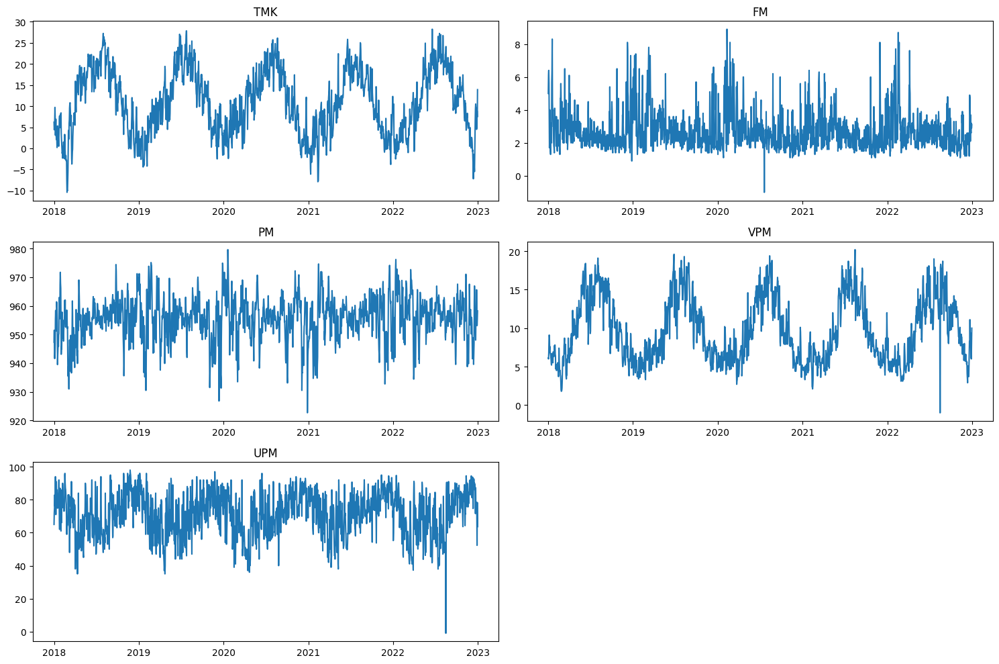

In [14]:
plt.figure(figsize=(15, 10))

cols = ['TMK', 'FM', 'PM', 'VPM', 'UPM']

for i in range(5):
    plt.subplot(3, 2, i + 1)
    plot_ts(df_2020, cols[i])

plt.tight_layout()
plt.show()

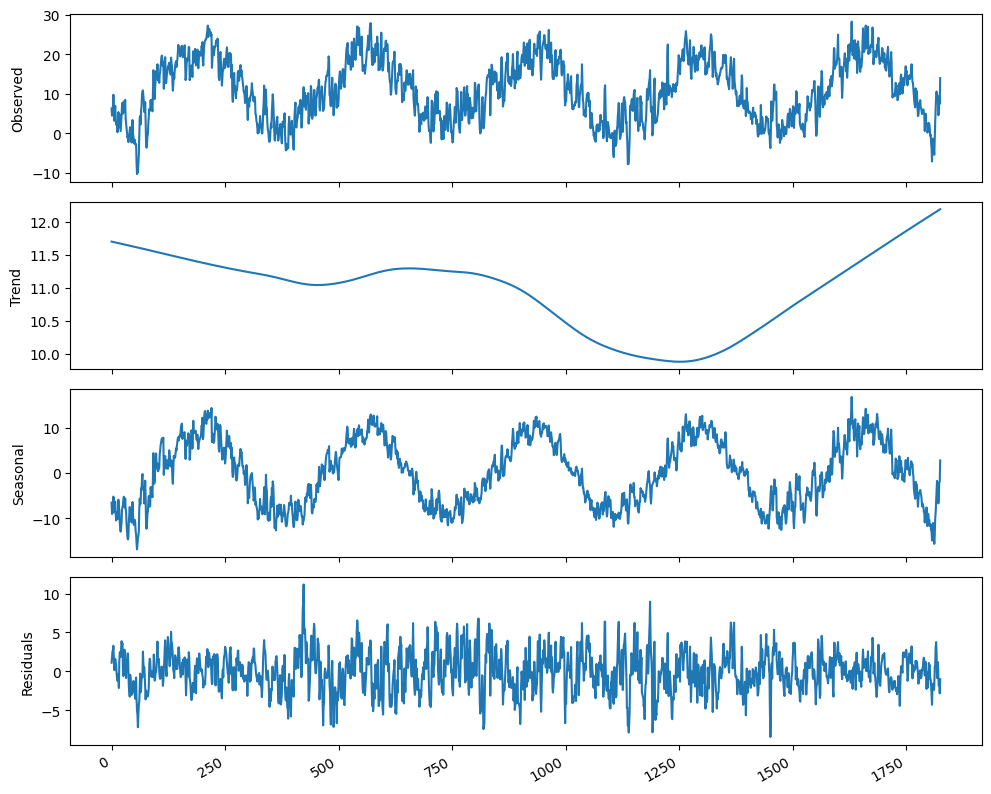

In [15]:
decomposition = STL(df_2020['TMK'], period=365).fit()

fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=4, ncols=1, sharex=True, figsize=(10,8))

ax1.plot(decomposition.observed)
ax1.set_ylabel('Observed')

ax2.plot(decomposition.trend)
ax2.set_ylabel('Trend')

ax3.plot(decomposition.seasonal)
ax3.set_ylabel('Seasonal')

ax4.plot(decomposition.resid)
ax4.set_ylabel('Residuals')

fig.autofmt_xdate()
plt.tight_layout()

## Split & Scale data

In [16]:
print(len(df_2020))
print(len(df_2020) * 0.8)

1826
1460.8000000000002


In [17]:
train_df = df_2020[:1460].drop(columns=['MESS_DATUM']).reset_index(drop=True)
test_df = df_2020[1460:].drop(columns=['MESS_DATUM']). reset_index(drop=True)

In [18]:
scalers={}

scaled_train = train_df.copy()
for i in train_df.columns:
    scaler = MinMaxScaler(feature_range=(-1, 1))
    s_s = scaler.fit_transform(scaled_train[i].values.reshape(-1,1))
    s_s = np.reshape(s_s,len(s_s))
    scalers['scaler_'+ i] = scaler
    scaled_train[i]=s_s
    
scaled_test = test_df.copy()
for i in test_df.columns:
    scaler = scalers['scaler_'+i]
    s_s = scaler.transform(scaled_test[i].values.reshape(-1,1))
    s_s=np.reshape(s_s,len(s_s))
    scalers['scaler_'+i] = scaler
    scaled_test[i]=s_s

## SARIMAX

In [ ]:
statistic = []
p_value = []
for i in range(11):
    ad_fuller_result = adfuller(scaled_train[scaled_train.columns[i]])
    statistic.append(ad_fuller_result[0])
    p_value.append(round(ad_fuller_result[1], 5))
    
ADF_res = pd.DataFrame({'Statistic': statistic, 'P-value': p_value}, index=scaled_train.columns)
ADF_res

,Statistic,P-value
FX,-6.830838,0.00000
FM,-8.127475,0.00000
SDK,-3.784396,0.00307
NM,-7.663985,0.00000
VPM,-2.536297,0.10689
PM,-12.241508,0.00000
TMK,-2.629805,0.08699
UPM,-3.422825,0.01020
TXK,-2.883903,0.04725
TNK,-2.502936,0.11476


In [ ]:
diff_data = scaled_train.diff()
diff_data = diff_data.iloc[1:, :]

statistic = []
p_value = []
for i in range(11):
    ad_fuller_result = adfuller(diff_data[diff_data.columns[i]])
    statistic.append(ad_fuller_result[0])
    p_value.append(round(ad_fuller_result[1], 5))
    
ADF_res = pd.DataFrame({'Statistic': statistic, 'P-value': p_value}, index=diff_data.columns)
ADF_res

,Statistic,P-value
FX,-12.580669,0.0
FM,-12.515880,0.0
SDK,-12.764731,0.0
NM,-13.270070,0.0
VPM,-14.361195,0.0
PM,-13.843815,0.0
TMK,-15.058108,0.0
UPM,-12.554024,0.0
TXK,-15.218893,0.0
TNK,-15.334696,0.0


### Find the optimize hyperparameters

In [ ]:
def optimize_SARIMAX(endog, exog, order_list, d, D, s):
    results = []
    for order in tqdm(order_list):
        try:
            model = SARIMAX(
                endog, exog, 
                order=(order[0], d, order[1]), 
                seasonal_order=(order[2], D, order[3], s), 
                simple_differencing=False
            ).fit(disp=False)
            aic = model.aic
            results.append([order, aic])
        except:
            continue
    result_df = pd.DataFrame(results, columns=['(p,q,P,Q)', 'AIC'])
    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)
    return result_df

In [ ]:
p = range(1, 3, 1)
d = 1
q = range(1, 3, 1)
P = range(1, 3, 1)
D = 0
Q = range(1, 3, 1)
s = 30

parameters = list(product(p, q, P, Q))

In [ ]:
def recursive_forecast(endog, exog, train_len, horizon, window, order, seasonal_order):
    pred_SARIMAX = []
    for i in range(train_len, train_len + horizon, window):
        try:
            model = SARIMAX(endog[:i], exog[:i], 
                            order=order, 
                            seasonal_order=seasonal_order, 
                            simple_differencing=False)
            res = model.fit(disp=False)
            predictions = res.get_prediction(exog=exog[i:i + window])
            oos_pred = predictions.predicted_mean.iloc[:window]
            pred_SARIMAX.extend(oos_pred)
        except:
            pred_SARIMAX.extend([np.nan] * window)
    return pred_SARIMAX[:horizon]

### Model training

In [ ]:
metrics = []
prediction_SARIMAX = []

# Loop through each variable as the target
for target_col in scaled_train.columns:
    target = scaled_train[target_col]
    exog = scaled_train.drop(columns=[target_col])

    # Find best parameters for the SARIMAX model
    result_df = optimize_SARIMAX(target, exog, parameters, d, D, s)
    best_order = result_df.iloc[0]['(p,q,P,Q)']
    
    # Train SARIMAX with best parameters
    start = time.time()
    best_model = SARIMAX(target, exog, 
                         order=(best_order[0], d, best_order[1]), 
                         seasonal_order=(best_order[2], D, best_order[3], s), 
                         simple_differencing=False)
    best_model_fit = best_model.fit(disp=False)
    end = time.time()
    
    # Forecast on the test set
    target_test = scaled_test[target_col]
    exog_test = scaled_test.drop(columns=[target_col])
    train_len = len(target)
    horizon = len(target_test)
    window = 90
    
    pred_SARIMAX = recursive_forecast(target, exog, train_len, horizon, window, 
                                      (best_order[0], d, best_order[1]), 
                                      (best_order[2], D, best_order[3], s))
        
    # Compute performance metrics
    mse = mean_squared_error(target_test, pred_SARIMAX, squared=True)
    rmse = mean_squared_error(target_test, pred_SARIMAX, squared=False)
    mae = mean_absolute_error(target_test, pred_SARIMAX)
    r2 = r2_score(target_test, pred_SARIMAX)

    # Unscale predictions
    scaler = scalers[f'scaler_{target_col}']
    unscaled_SARIMAX = scaler.inverse_transform(
        np.array(pred_SARIMAX[:horizon]).reshape(-1, 1)
    )
    prediction_SARIMAX.append(unscaled_SARIMAX)
    
    # Unscaled target
    real_values = df_2020.loc[1460:, target_col].values  # Adjust index as needed
    
    # Compute unscaled metrics
    unscale_mse = mean_squared_error(real_values, unscaled_SARIMAX)
    unscale_rmse = mean_squared_error(real_values, unscaled_SARIMAX, squared=False)
    unscale_mae = mean_absolute_error(real_values, unscaled_SARIMAX)
    
    # Store metrics
    metrics.append({
        'Variable': target_col,
        'Best Order': best_order,
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'Unscale MSE': unscale_mse,
        'Unscale RMSE': unscale_rmse,
        'Unscale MAE': unscale_mae,
        'R2': r2,
        'Time': end-start
    })

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [ ]:
metrics_df = pd.DataFrame(metrics)
print(metrics_df)

   Variable    Best Order       MSE      RMSE       MAE  Unscale MSE  \
0        FX  (1, 1, 1, 1)  0.136510  0.369473  0.275420    39.451405   
1        FM  (1, 1, 1, 1)  0.111330  0.333662  0.250099     2.727868   
2       SDK  (1, 1, 1, 1)  0.674310  0.821164  0.662703    41.552694   
3        NM  (1, 1, 1, 1)  0.456367  0.675549  0.510414     9.241429   
4       VPM  (1, 2, 1, 1)  0.428600  0.654675  0.521916    36.276685   
5        PM  (1, 2, 1, 1)  0.176534  0.420159  0.350333   142.886890   
6       TMK  (2, 2, 1, 2)  0.432279  0.657479  0.541855   157.699697   
7       UPM  (2, 1, 1, 1)  0.383699  0.619435  0.480004   380.725533   
8       TXK  (1, 1, 1, 1)  0.468080  0.684163  0.565239   220.414011   
9       TNK  (2, 1, 1, 1)  0.370159  0.608407  0.495078   112.069204   
10      TGK  (2, 1, 1, 1)  0.408300  0.638983  0.517184   122.907428   

    Unscale RMSE  Unscale MAE        R2        Time  
0       6.281035     4.682144 -1.189882   77.663679  
1       1.651626     1.2379

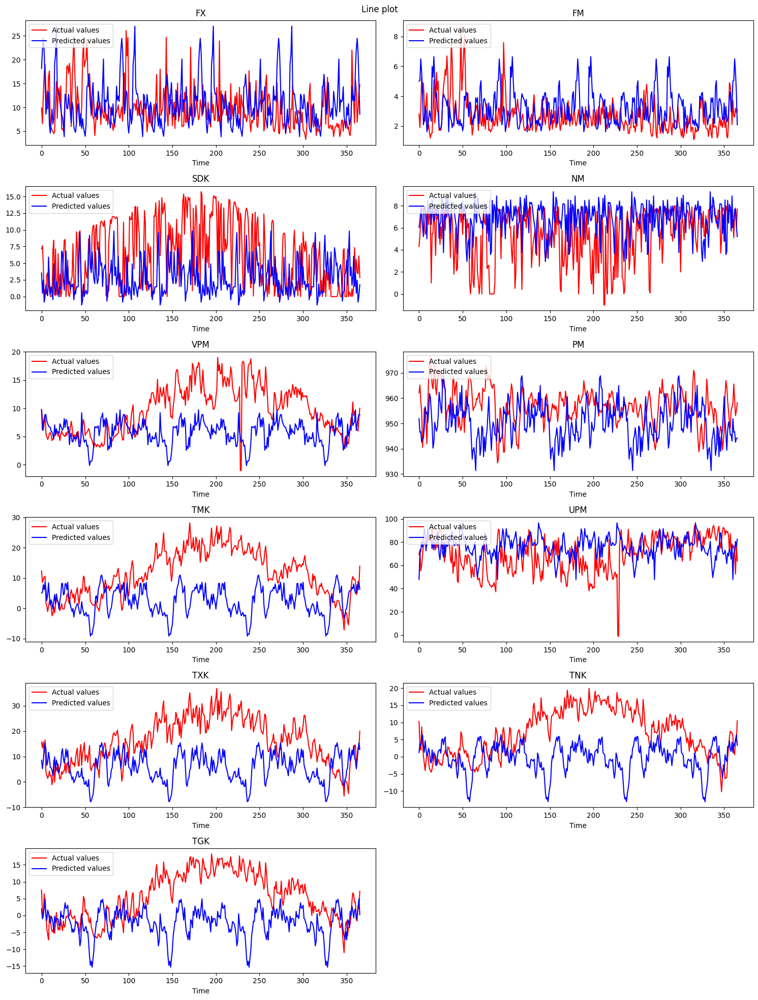

In [ ]:
plt.figure(figsize=(15, 20))
prediction_SARIMAX = np.array(prediction_SARIMAX)
for i in range(11):
    plt.subplot(6, 2, i + 1)  
    plt.plot(test_df.index, test_df.iloc[:, i], 'r-', markersize=10, label='Actual values')
    plt.plot(test_df.index, prediction_SARIMAX[i], 'b-', label='Predicted values')
    plt.xlabel('Time')
    plt.title(f'{test_df.columns[i]}')
    plt.legend(loc='upper left')

plt.suptitle('Line plot')
plt.tight_layout()
plt.show()

## Gaussian Process

### Define model and training

In [44]:
train_Gaussian = diff_data
test_Gaussian = scaled_test

In [45]:
X_train = train_Gaussian.index.values.reshape(-1, 1)
y_train = train_Gaussian.values

X_test = test_Gaussian.index.values.reshape(-1, 1)
y_test = test_Gaussian.values

print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(1459, 1) (1459, 11) (366, 1) (366, 11)


In [ ]:
gp_models = []

start = time.time()
for i in range(11):
    y_train_single = y_train[:, i].reshape(-1, 1)

    kernel = (
        GPy.kern.RBF(input_dim=1, lengthscale=90.0) * GPy.kern.PeriodicExponential(input_dim=1, period=1., lengthscale=1.0) +
        GPy.kern.RBF(input_dim=1, lengthscale=3.0) + GPy.kern.RatQuad(input_dim=1, lengthscale=7.0, power=1.0)
    )

    model = GPy.models.GPRegression(X_train, y_train_single, kernel)

    model.optimize(messages=True)
    
    gp_models.append(model)
end = time.time()
print(end-start)

621.4030344486237


In [51]:
def unscale(data):
    temp = data.copy()
    for index, i in enumerate(train_df.columns):
        scaler = scalers['scaler_' + i]
        temp[:, index] = scaler.inverse_transform(np.reshape(data[:, index], (-1, 1))).flatten()
    return temp

In [ ]:
predictions = []
sigma = []

for i, model in enumerate(gp_models):
    mean, variance = model.predict(X_test)
    predictions.append(mean)
    sigma.append(variance)

predictions = np.hstack(predictions)
sigma = np.hstack(sigma)

In [ ]:
last_value = scaled_train.iloc[-1, :].values
y_pred = predictions.cumsum(axis=0) + last_value

In [53]:
y_pred_unscale = unscale(y_pred)
sigma_unscale = unscale(sigma)

In [ ]:
pred_scaled_Gau = pd.DataFrame(data=y_pred, columns=df_2020.drop(columns=['MESS_DATUM']).columns)
pred_scaled_Gau.head()

,FX,FM,SDK,NM,VPM,PM,TMK,UPM,TXK,TNK,TGK
0,-0.152940,0.151515,-0.955414,0.933333,0.254609,0.234457,0.071766,0.748725,0.004153,0.397684,0.463977
1,-0.152939,0.151515,-0.955414,0.933333,0.277355,0.238227,0.008730,0.927671,-0.000989,0.393747,0.463977
2,-0.152937,0.151515,-0.955414,0.933334,0.369844,0.256709,0.080636,1.074622,0.002382,0.384668,0.463977
3,-0.152937,0.151515,-0.955414,0.933334,0.439160,0.275627,0.121227,1.208840,0.003533,0.385283,0.463977
4,-0.152937,0.151515,-0.955414,0.933334,0.494227,0.260430,0.122622,1.315944,0.012707,0.392096,0.463977


In [ ]:
pred_Gau = pd.DataFrame(y_pred_unscale, columns=df_2020.drop(columns=['MESS_DATUM']).columns)
pred_Gau.head()

,FX,FM,SDK,NM,VPM,PM,TMK,UPM,TXK,TNK,TGK
0,13.400017,4.7,0.350000,7.700000,13.342403,957.820304,10.070728,90.084852,13.690123,10.919706,10.0
1,13.400039,4.7,0.350000,7.700001,13.551670,957.927551,8.866739,95.721621,13.578549,10.851202,10.0
2,13.400064,4.7,0.350001,7.700001,14.402568,958.453372,10.240145,100.350598,13.651690,10.693224,10.0
3,13.400072,4.7,0.350002,7.700001,15.040273,958.991601,11.015438,104.578453,13.676670,10.703929,10.0
4,13.400064,4.7,0.350003,7.700001,15.546887,958.559248,11.042078,107.952223,13.875745,10.822473,10.0


### Model Evaluation
#### Scaled data

In [ ]:
for i in range(11):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(scaled_test.iloc[:, i], pred_scaled_Gau.iloc[:, i])}')
    
print(f'MSE total: {mean_squared_error(scaled_test, pred_scaled_Gau)}')

MSE for FX: 0.10633475093639602
MSE for FM: 0.2177875274571904
MSE for SDK: 0.9397055907234012
MSE for NM: 0.5341915323089267
MSE for VPM: 0.7909276267325385
MSE for PM: 0.06458982192621864
MSE for TMK: 0.11352415014123164
MSE for UPM: 0.9796607320972487
MSE for TXK: 0.1830140223525678
MSE for TNK: 0.19684110152950351
MSE for TGK: 0.2211232050340222
MSE total: 0.3952454601126586


In [ ]:
for i in range(11):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(scaled_test.iloc[:, i], pred_scaled_Gau.iloc[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(scaled_test, pred_scaled_Gau, squared=False)}')

RMSE for FX: 0.3260900963482271
RMSE for FM: 0.4666771126348392
RMSE for SDK: 0.9693841296015739
RMSE for NM: 0.7308840758348253
RMSE for VPM: 0.8893411194432306
RMSE for PM: 0.2541452772062047
RMSE for TMK: 0.3369334506118851
RMSE for UPM: 0.989778122660452
RMSE for TXK: 0.4278013818965149
RMSE for TNK: 0.44366778283925856
RMSE for TGK: 0.4702373922116596
RMSE total: 0.5731763582989701


In [ ]:
for i in range(11):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(scaled_test.iloc[:, i], pred_scaled_Gau.iloc[:, i])}')
    
print(f'MAE total: {mean_absolute_error(scaled_test, pred_scaled_Gau)}')

MAE for FX: 0.288123747392246
MAE for FM: 0.4370480803831297
MAE for SDK: 0.762205816300117
MAE for NM: 0.5141469896407438
MAE for VPM: 0.8345923291468729
MAE for PM: 0.19201774202404245
MAE for TMK: 0.2722889110216979
MAE for UPM: 0.8814393039169137
MAE for TXK: 0.3567336109511736
MAE for TNK: 0.36621802507654805
MAE for TGK: 0.3887497834394462
MAE total: 0.4812331217539027


#### Unscaled data

In [ ]:
for i in range(11):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(test_df.iloc[:, i], pred_Gau.iloc[:, i])}')
    
print(f'MSE total: {mean_squared_error(test_df, pred_Gau)}')

MSE for FX: 30.730743020618448
MSE for FM: 5.336338891519808
MSE for SDK: 57.90700776435279
MSE for NM: 10.817378529255766
MSE for VPM: 66.94411432664204
MSE for PM: 52.27916334163615
MSE for TMK: 41.41474521302273
MSE for UPM: 972.0683614234952
MSE for TXK: 86.17947298560067
MSE for TNK: 59.59561189907248
MSE for TGK: 66.56305998735395
MSE total: 131.80327248932454


In [ ]:
for i in range(11):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(test_df.iloc[:, i], pred_Gau.iloc[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(test_df, pred_Gau, squared=False)}')

RMSE for FX: 5.54353163791986
RMSE for FM: 2.310051707542454
RMSE for SDK: 7.609665417372356
RMSE for NM: 3.288978341256714
RMSE for VPM: 8.18193829887772
RMSE for PM: 7.230433136516522
RMSE for TMK: 6.435428906687007
RMSE for UPM: 31.17801086380424
RMSE for TXK: 9.283289987154374
RMSE for TNK: 7.719819421403099
RMSE for TGK: 8.158618754872295
RMSE total: 8.812706043036966


In [ ]:
for i in range(11):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(test_df.iloc[:, i], pred_Gau.iloc[:, i])}')
    
print(f'MAE total: {mean_absolute_error(test_df, pred_Gau)}')

MAE for FX: 4.8981037056681815
MAE for FM: 2.1633879978964923
MAE for SDK: 5.9833156579559175
MAE for NM: 2.313661453383347
MAE for VPM: 7.678249428151231
MAE for PM: 5.462904760584005
MAE for TMK: 5.20071820051443
MAE for UPM: 27.765338073382786
MAE for TXK: 7.741119357640465
MAE for TNK: 6.372193636331937
MAE for TGK: 6.744808742674391
MAE total: 7.483981910380286


In [ ]:
for i in range(11):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(test_df.iloc[:, i], pred_Gau.iloc[:, i])}')
    
print(f'R2 total: {r2_score(test_df, pred_Gau)}')

R2 for FX: -0.7058127091370614
R2 for FM: -3.0870215137555084
R2 for SDK: -1.5029073638331272
R2 for NM: -0.9087676004819369
R2 for VPM: -2.9292711057467744
R2 for PM: -0.059000508876208
R2 for TMK: 0.28376717281995156
R2 for UPM: -3.330754424840787
R2 for TXK: -0.08458187712477794
R2 for TNK: -0.3598316403142856
R2 for TGK: -0.41738501604794065
R2 total: -1.1910515079398591


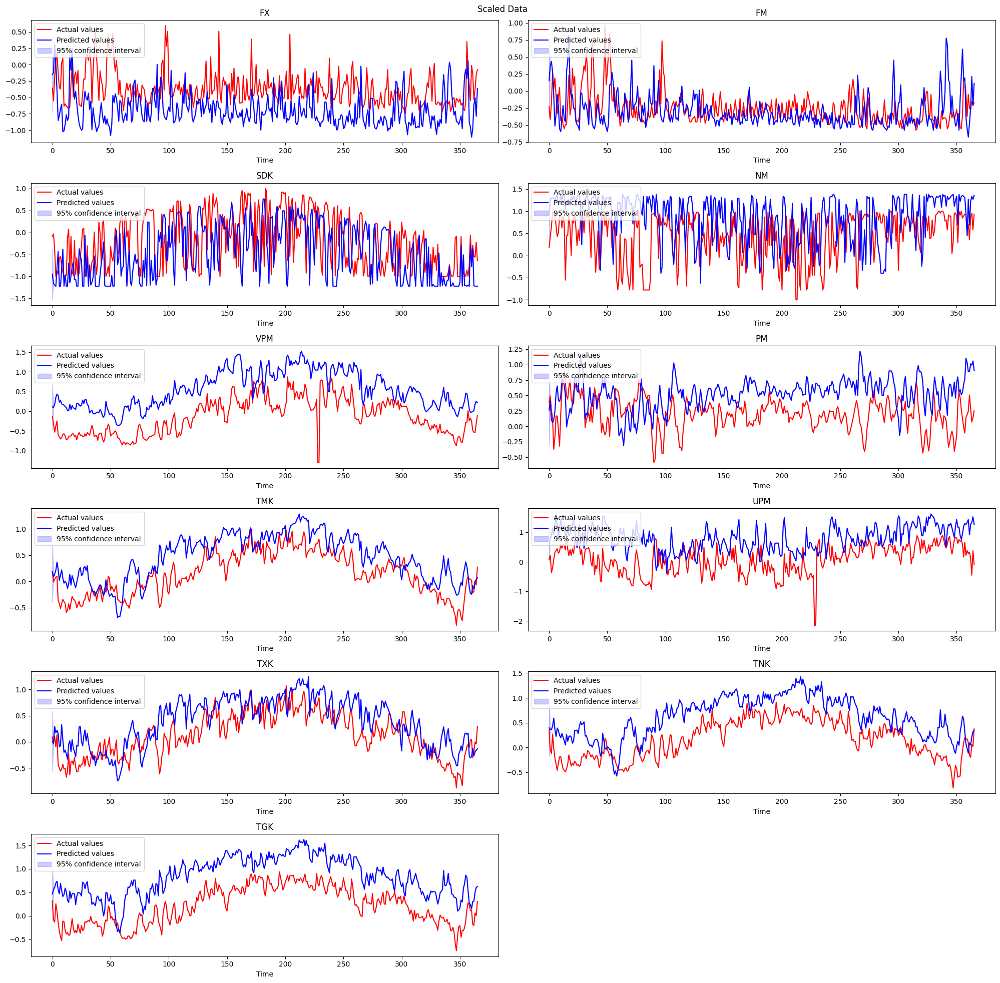

In [ ]:
plt.figure(figsize=(20, 20))
for i in range(11):
    plt.subplot(6, 2, i + 1)  
    plt.plot(X_test, y_test[:, i], 'r-', markersize=10, label='Actual values')
    plt.plot(X_test, y_pred[:, i], 'b-', label='Predicted values')
    plt.fill_between(X_test.flatten(), y_pred[:, i] - 1.96 * sigma[:, i], y_pred[:, i] + 1.96 * sigma[:, i], alpha=0.2, color='blue', label='95% confidence interval')
    plt.xlabel('Time')
    plt.title(f'{scaled_test.columns[i]}')
    plt.legend(loc='upper left')

plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

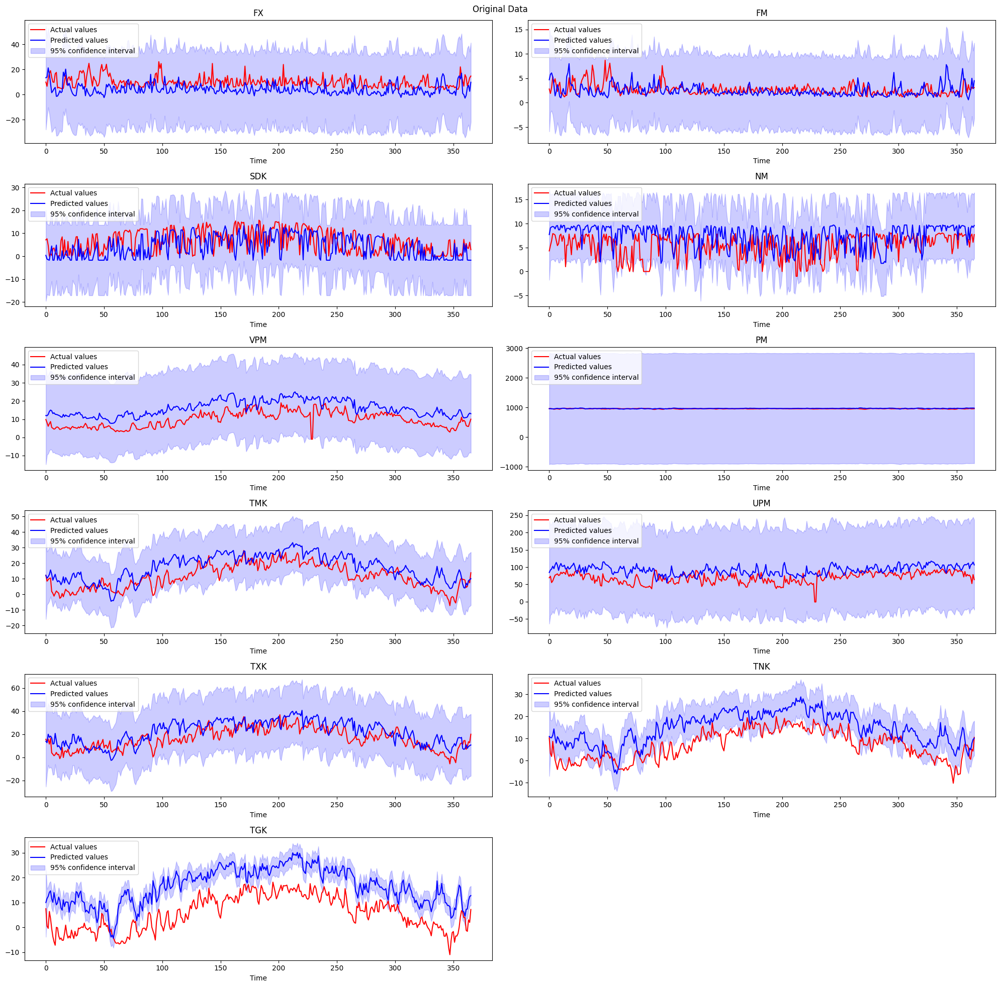

In [ ]:
plt.figure(figsize=(20, 20))
for i in range(11):
    plt.subplot(6, 2, i + 1)  
    plt.plot(X_test, test_df.iloc[:, i], 'r-', markersize=10, label='Actual values')
    plt.plot(X_test, pred_Gau.iloc[:, i], 'b-', label='Predicted values')
    plt.fill_between(X_test.flatten(), pred_Gau.iloc[:, i] - 1.96 * sigma_unscale[:, i], pred_Gau.iloc[:, i] + 1.96 * sigma_unscale[:, i], alpha=0.2, color='blue', label='95% confidence interval')
    plt.xlabel('Time')
    plt.title(f'{scaled_test.columns[i]}')
    plt.legend(loc='upper left')

plt.suptitle('Original Data')
plt.tight_layout()
plt.show()

## VAR

In [65]:
statistic = []
p_value = []
for i in range(11):
    ad_fuller_result = adfuller(scaled_train[scaled_train.columns[i]])
    statistic.append(ad_fuller_result[0])
    p_value.append(round(ad_fuller_result[1], 5))
    
ADF_res = pd.DataFrame({'Statistic': statistic, 'P-value': p_value}, index=scaled_train.columns)
ADF_res

,Statistic,P-value
FX,-6.830838,0.00000
FM,-8.127475,0.00000
SDK,-3.784396,0.00307
NM,-7.663985,0.00000
VPM,-2.536297,0.10689
PM,-12.241508,0.00000
TMK,-2.629805,0.08699
UPM,-3.422825,0.01020
TXK,-2.883903,0.04725
TNK,-2.502936,0.11476


### Find the optimize hyperparameters

In [66]:
def optimize_VAR(endog: Union[pd.Series, list]) -> pd.DataFrame:
    
    results = [[1, -22476.182547798704], [2, -22771.51352915151], [3, -22816.94297692379], [4, -22736.20873475218], [5, -22660.602362953374], [6, -22561.73761599999], [7, -22500.05282380872], [8, -22380.165835240245], [9, -22260.014225036557], [10, -22189.29426296569], [11, -22094.77402245826], [12, -22007.252735960556], [13, -21891.160148328156]]
    
    for i in tqdm_notebook(range(14,15)):
        try:
            model = VARMAX(endog, order=(i, 0)).fit(dips=False)
        except:
            continue
            
        aic = model.aic
        results.append([i, aic])
        print(results)
        
    result_df = pd.DataFrame(results)
    result_df.columns = ['p', 'AIC']
    
    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)
    
    return result_df

In [67]:
result_df = optimize_VAR(diff_data)
result_df

  0%|          | 0/1 [00:00<?, ?it/s]

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         1771     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.46132D+00    |proj g|=  2.32918D+00


 This problem is unconstrained.



At iterate    5    f= -8.48091D+00    |proj g|=  1.98371D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 1771      5      9      1     0     0   1.984D+00  -8.481D+00
  F =  -8.4809109690486526     

STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT        
[[1, -22476.182547798704], [2, -22771.51352915151], [3, -22816.94297692379], [4, -22736.20873475218], [5, -22660.602362953374], [6, -22561.73761599999], [7, -22500.05282380872], [8, -22380.165835240245], [9, -22260.014225036557], [10, -22189.29426296569], [11, -22094.77402245826], [12, -22007.252735960556], [13, -21891.160148328156], [14, -21205.29820768397]]

,p,AIC
0,3,-22816.942977
1,2,-22771.513529
2,4,-22736.208735
3,5,-22660.602363
4,6,-22561.737616
5,7,-22500.052824
6,1,-22476.182548
7,8,-22380.165835
8,9,-22260.014225
9,10,-22189.294263


### Performing tests

In [68]:
def granger_causality_matrix(data, max_lag):
    variables = data.columns
    df = pd.DataFrame(index=variables, columns=variables)
    for var1 in variables:
        for var2 in variables:
            test_result = grangercausalitytests(data[[var1, var2]], max_lag, verbose=False)
            p_values = [round(test[0]['ssr_ftest'][1], 4) for test in test_result.values()]
            min_p_value = np.min(p_values)
            df.loc[var1, var2] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

In [ ]:
result = granger_causality_matrix(diff_data, 3)
result

,FX_x,FM_x,SDK_x,NM_x,VPM_x,PM_x,TMK_x,UPM_x,TXK_x,TNK_x,TGK_x
FX_y,1.0,0.0007,0.3722,0.4081,0.0,0.0,0.0,0.0013,0.0,0.0,0.0
FM_y,0.0,1.0,0.1545,0.0842,0.0,0.0,0.0,0.1715,0.0,0.0,0.0
SDK_y,0.0001,0.2987,1.0,0.0,0.0,0.0,0.0,0.0006,0.0,0.0,0.0
NM_y,0.0878,0.1194,0.0741,1.0,0.0006,0.0,0.0017,0.0413,0.0003,0.0118,0.0017
VPM_y,0.0,0.0,0.0,0.0001,1.0,0.0284,0.0,0.0,0.0,0.0,0.0
PM_y,0.0,0.0,0.0,0.0001,0.1793,1.0,0.0001,0.0,0.0,0.0091,0.1452
TMK_y,0.0,0.0,0.0001,0.0018,0.0147,0.0,1.0,0.0883,0.0093,0.0002,0.0
UPM_y,0.0003,0.0261,0.0002,0.0,0.0,0.0,0.0,1.0,0.0018,0.0,0.0
TXK_y,0.0,0.0,0.0001,0.0001,0.004,0.0,0.0,0.0049,1.0,0.0,0.0006
TNK_y,0.0,0.0,0.0,0.0001,0.0,0.0,0.0,0.0,0.0,1.0,0.0001


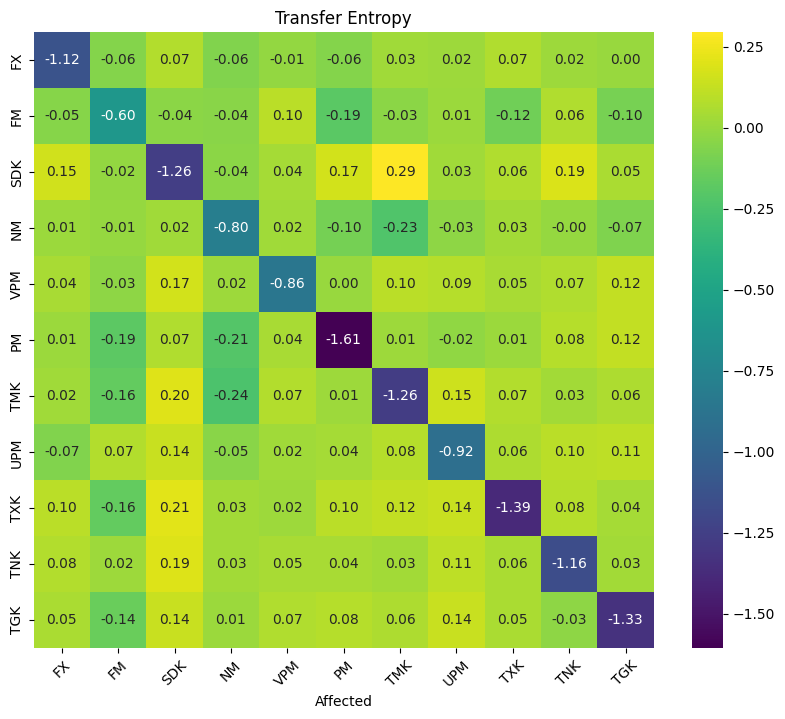

In [ ]:
transfer_entropy_matrix = np.zeros((11, 11))

for i in range(11):
    for j in range(11):
        transfer = transent(scaled_train.iloc[:, i], scaled_train.iloc[:, j], lag=3)
        transfer_entropy_matrix[i, j] = transfer

transfer_entropy_df = pd.DataFrame(transfer_entropy_matrix, 
                                   columns=[f'{scaled_train.columns[i]}' for i in range(11)], 
                                   index=[f'{scaled_train.columns[j]}' for j in range(11)])

plt.figure(figsize=(10, 8))
sns.heatmap(transfer_entropy_df, annot=True, cmap='viridis', fmt=".2f")
plt.title('Transfer Entropy')
plt.xlabel('Affected')
plt.xticks(rotation=45)
plt.show()

In [ ]:
VAR_train = scaled_train.drop(columns=['FM', 'NM', 'SDK', 'TXK'])
VAR_test = scaled_test.drop(columns=['FM', 'NM', 'SDK', 'TXK'])

In [ ]:
result = granger_causality_matrix(VAR_train, 3)
result

,FX_x,VPM_x,PM_x,TMK_x,UPM_x,TNK_x,TGK_x
FX_y,1.0,0.0,0.0,0.0,0.0,0.0,0.0
VPM_y,0.0,1.0,0.0049,0.0,0.0,0.0,0.0
PM_y,0.0,0.0076,1.0,0.0006,0.0001,0.0033,0.0198
TMK_y,0.0,0.0001,0.0,1.0,0.0357,0.0008,0.0
UPM_y,0.0072,0.0,0.0,0.0003,1.0,0.0,0.0
TNK_y,0.0,0.0,0.0,0.0,0.0,1.0,0.0002
TGK_y,0.0,0.0,0.0,0.0,0.0,0.0,1.0


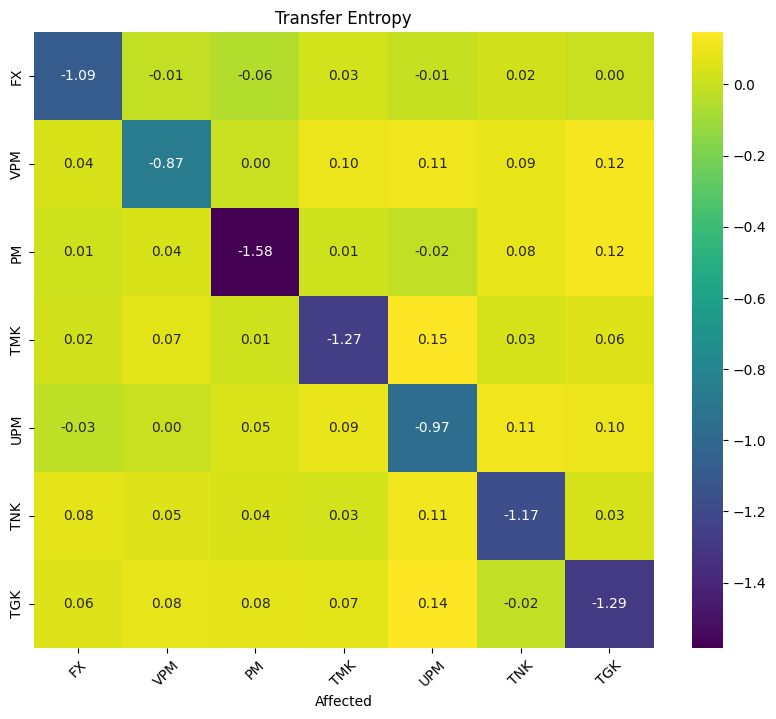

In [ ]:
transfer_entropy_matrix = np.zeros((7, 7))

for i in range(7):
    for j in range(7):
        transfer = transent(VAR_train.iloc[:, i], VAR_train.iloc[:, j], lag=3)
        transfer_entropy_matrix[i, j] = transfer

transfer_entropy_df = pd.DataFrame(transfer_entropy_matrix, 
                                   columns=[f'{VAR_train.columns[i]}' for i in range(7)], 
                                   index=[f'{VAR_train.columns[j]}' for j in range(7)])

plt.figure(figsize=(10, 8))
sns.heatmap(transfer_entropy_df, annot=True, cmap='viridis', fmt=".2f")
plt.title('Transfer Entropy')
plt.xlabel('Affected')
plt.xticks(rotation=45)
plt.show()

### Model training

In [ ]:
start = time.time()
best_model = VARMAX(VAR_train, order=(3,0))
best_model_fit = best_model.fit(disp=False)
end = time.time()
print(best_model_fit.summary())

                                          Statespace Model Results                                         
Dep. Variable:     ['FX', 'VPM', 'PM', 'TMK', 'UPM', 'TNK', 'TGK']   No. Observations:                 1460
Model:                                                      VAR(3)   Log Likelihood                8648.386
                                                       + intercept   AIC                         -16932.772
Date:                                             Thu, 14 Nov 2024   BIC                         -15970.685
Time:                                                     15:04:23   HQIC                        -16573.875
Sample:                                                          0                                         
                                                            - 1460                                         
Covariance Type:                                               opg                                         
Ljung-Box (L1) (Q):     0.01

In [ ]:
print(end-start)

206.35968446731567


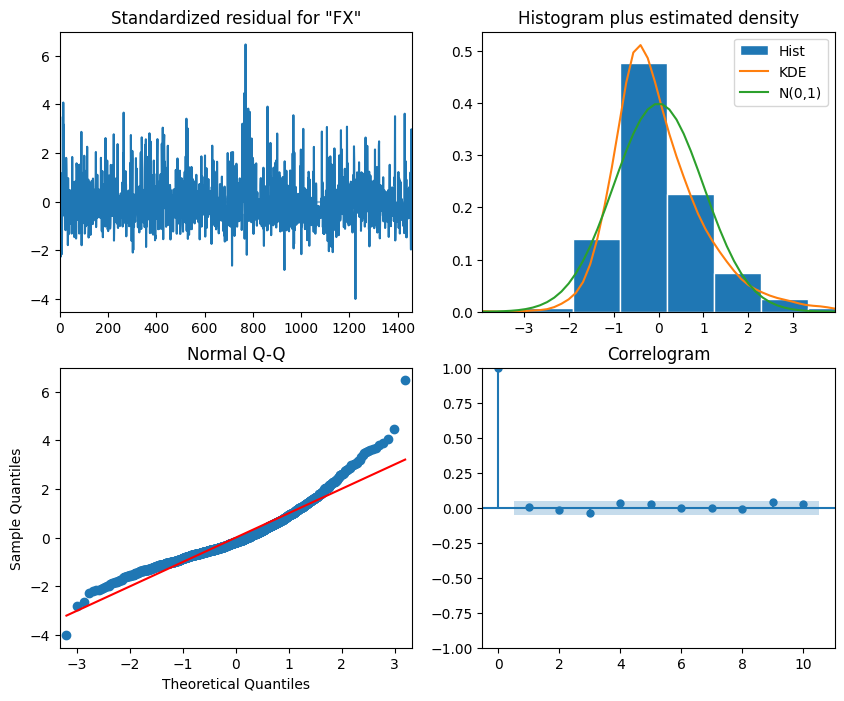

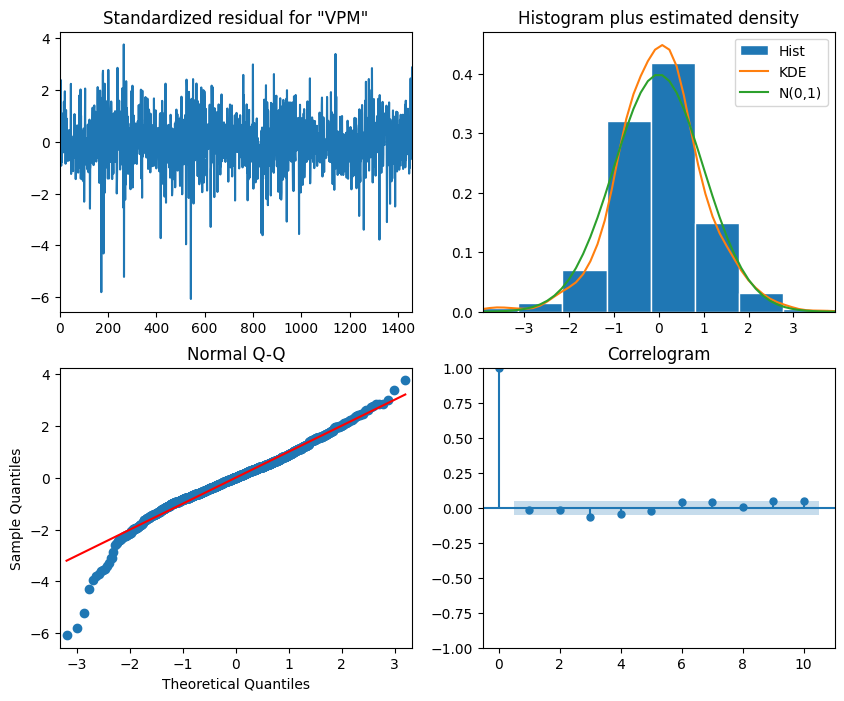

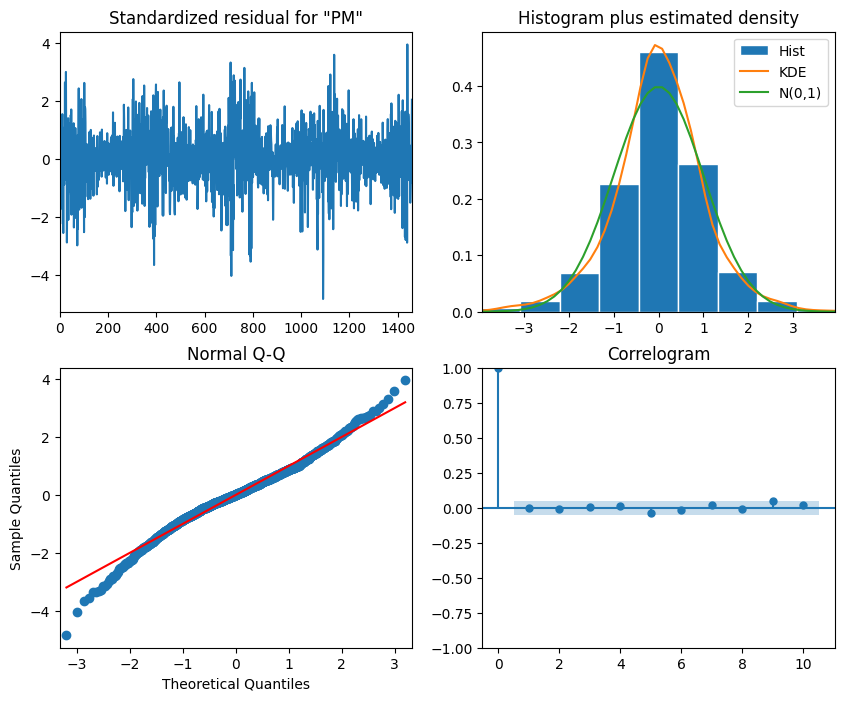

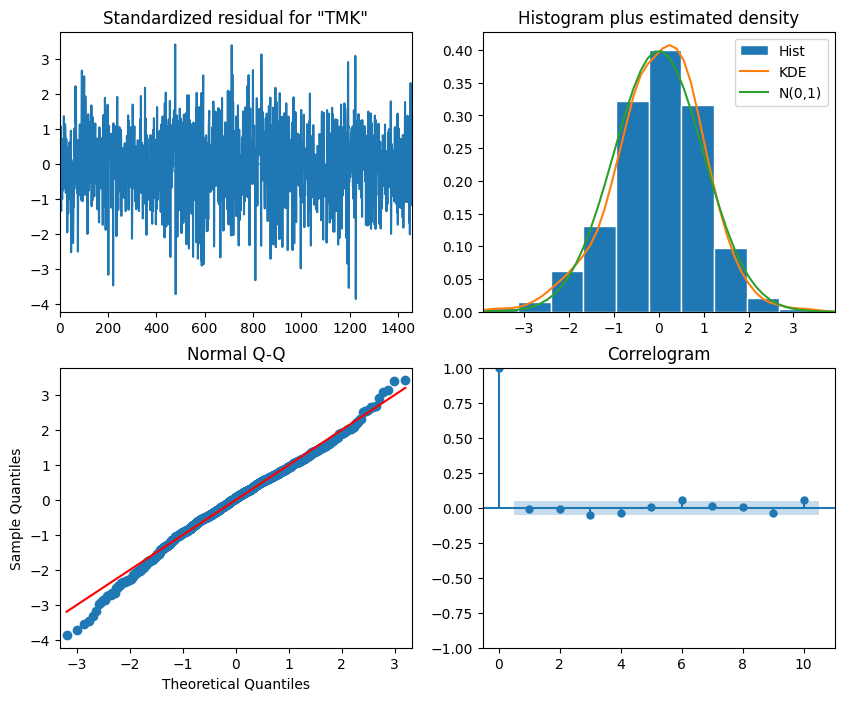

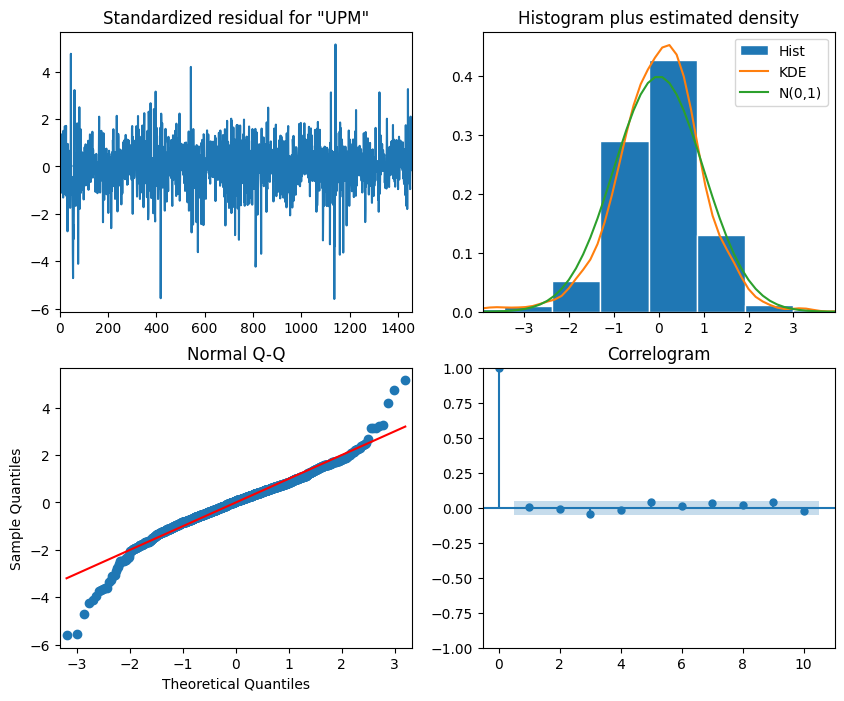

In [ ]:
for i in range(6):
    best_model_fit.plot_diagnostics(figsize=(10, 8), variable=i)

plt.show()

In [ ]:
TRAIN_LEN = len(VAR_train)
HORIZON = len(VAR_test)
WINDOW = HORIZON

In [ ]:
def rolling_forecast(df: pd.DataFrame, train_len: int, horizon: int, window: int) -> pd.DataFrame:
    
    total_len = train_len + horizon
    end_idx = train_len
    
    predictions_dict = {col: [] for col in df.columns}

    for i in range(train_len, total_len, window):
        model = VARMAX(df[:i], order=(3,0))
        res = model.fit(disp=False)
        predictions = res.get_prediction(0, i + window - 1)

        for col in df.columns:
            oos_pred = predictions.predicted_mean.iloc[-window:][col]
            predictions_dict[col].extend(oos_pred)

    predictions_df = pd.DataFrame(predictions_dict)
    return predictions_df


In [ ]:
pred_VAR = rolling_forecast(VAR_train, TRAIN_LEN, HORIZON, WINDOW)
pred_VAR.head()

,FX,VPM,PM,TMK,UPM,TNK,TGK
0,-0.224417,0.086614,0.331770,0.198043,0.484054,0.317681,0.363223
1,-0.306213,-0.014083,0.274058,0.159579,0.375075,0.248591,0.295081
2,-0.364823,-0.053911,0.234387,0.147723,0.306944,0.210768,0.258356
3,-0.387178,-0.069557,0.226475,0.148073,0.253266,0.193773,0.236978
4,-0.399490,-0.079063,0.221884,0.148357,0.216773,0.186286,0.225540


### Model Evaluation
#### Scaled data


In [ ]:
cols = pred_VAR.columns

for col in cols:
    print(f'MSE for {col}: {mean_squared_error(VAR_test.loc[:, col], pred_VAR.loc[:, col])}')
    
print(f'MSE total: {mean_squared_error(VAR_test, pred_VAR)}')

MSE for FX: 0.06282975188876665
MSE for VPM: 0.20820510520075322
MSE for PM: 0.0639115158603558
MSE for TMK: 0.16502674138564488
MSE for UPM: 0.23215109701753595
MSE for TNK: 0.15014726148353513
MSE for TGK: 0.16299951851958222
MSE total: 0.1493244273365963


In [ ]:
for col in cols:
    print(f'RMSE for {col}: {mean_squared_error(VAR_test.loc[:, col], pred_VAR.loc[:, col], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(VAR_test, pred_VAR, squared=False)}')

RMSE for FX: 0.25065863617431305
RMSE for VPM: 0.4562949760853753
RMSE for PM: 0.2528072701888848
RMSE for TMK: 0.40623483526852405
RMSE for UPM: 0.48182060667590376
RMSE for TNK: 0.3874884017406652
RMSE for TGK: 0.4037319884769873
RMSE total: 0.37700524494437904


In [ ]:
for col in cols:
    print(f'MAE for {col}: {mean_absolute_error(VAR_test.loc[:, col], pred_VAR.loc[:, col])}')
    
print(f'MAE total: {mean_absolute_error(VAR_test, pred_VAR)}')

MAE for FX: 0.1897642579124121
MAE for VPM: 0.39272991372262844
MAE for PM: 0.19615922097971092
MAE for TMK: 0.3437512443564203
MAE for UPM: 0.387845958286776
MAE for TNK: 0.3371080072262845
MAE for TGK: 0.35199245230502446
MAE total: 0.3141930078270367


In [ ]:
for col in cols:
    print(f'R2 for {col}: {r2_score(VAR_test.loc[:, col], pred_VAR.loc[:, col])}')
    
print(f'R2 total: {r2_score(VAR_test, pred_VAR)}')

R2 for FX: -0.007909346097904502
R2 for VPM: -0.03434786734404405
R2 for PM: -0.04787915186514358
R2 for TMK: -0.04116674201837611
R2 for UPM: -0.02626282518031342
R2 for TNK: -0.03725794707184571
R2 for TGK: -0.04481605689976176
R2 total: -0.03423427663962702


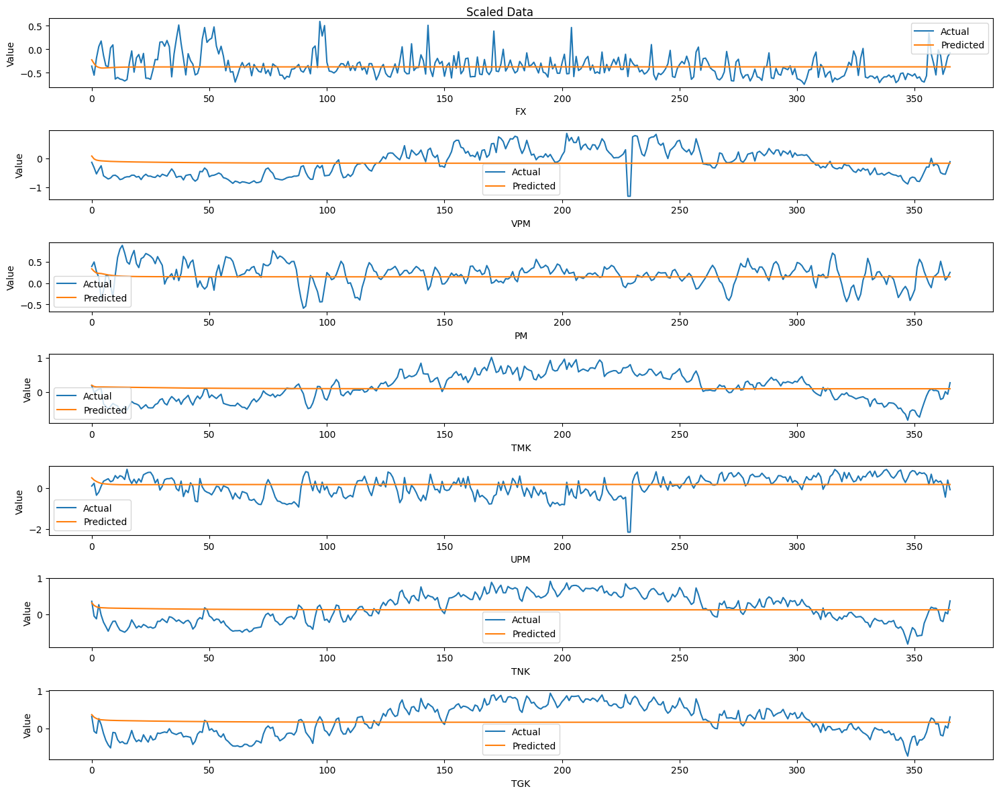

In [ ]:
plt.figure(figsize=(15, 15))
for i, col in enumerate(cols):
    plt.subplot(9, 1, i+1)
    plt.plot(VAR_test.loc[:, col], label='Actual')
    plt.plot(pred_VAR.loc[:, col], label='Predicted')
    plt.title('')
    plt.xlabel(f'{col}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

#### Unscaled data


In [ ]:
def inverse(dataset, cols):
    temp = dataset.copy()
    for col in cols:
        scaler = scalers['scaler_' + col]
        temp.loc[:, col] = scaler.inverse_transform(np.reshape(dataset.loc[:, col], (-1, 1))).flatten()
    return temp

In [ ]:
inverse_VAR = inverse(pred_VAR, cols)
inverse_VAR.head()

,FX,VPM,PM,TMK,UPM,TNK,TGK
0,12.184919,11.796846,960.588863,12.482625,81.747704,9.527645,8.251913
1,10.794378,10.870436,958.946944,11.747963,78.314850,8.325485,7.069652
2,9.798010,10.504016,957.818307,11.521516,76.168746,7.667356,6.432474
3,9.417968,10.360078,957.593218,11.528188,74.477882,7.371657,6.061566
4,9.208662,10.272618,957.462597,11.533617,73.328361,7.241381,5.863126


In [ ]:
VAR_test_df = test_df.drop(columns=['FM', 'NM', 'SDK', 'TXK'])

for col in cols:
    print(f'MSE for {col}: {mean_squared_error(VAR_test_df.loc[:, col], inverse_VAR.loc[:, col])}')
    
print(f'MSE total: {mean_squared_error(VAR_test_df, inverse_VAR)}')

MSE for FX: 18.157798295853564
MSE for VPM: 17.622480104191744
MSE for PM: 51.73014071616165
MSE for TMK: 60.20340552489713
MSE for UPM: 230.35192601565004
MSE for TNK: 45.458584886755084
MSE for TGK: 49.06652256356094
MSE total: 67.51297972958146


In [ ]:
for col in cols:
    print(f'RMSE for {col}: {mean_squared_error(VAR_test_df.loc[:, col], inverse_VAR.loc[:, col], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(VAR_test_df, inverse_VAR, squared=False)}')

RMSE for FX: 4.261196814963323
RMSE for VPM: 4.197913779985452
RMSE for PM: 7.192366836873774
RMSE for TMK: 7.7590853536288105
RMSE for UPM: 15.177349110290969
RMSE for TNK: 6.742298190287573
RMSE for TGK: 7.00475000007573
RMSE total: 7.476422869443661


In [ ]:
for col in cols:
    print(f'MAE for {col}: {mean_absolute_error(VAR_test_df.loc[:, col], inverse_VAR.loc[:, col])}')
    
print(f'MAE total: {mean_absolute_error(VAR_test_df, inverse_VAR)}')

MAE for FX: 3.225992384511006
MAE for VPM: 3.6131152062481813
MAE for PM: 5.580729836872778
MAE for TMK: 6.565648767207629
MAE for UPM: 12.21714768603344
MAE for TNK: 5.865679325737349
MAE for TGK: 6.107069047492175
MAE total: 6.16791175058608


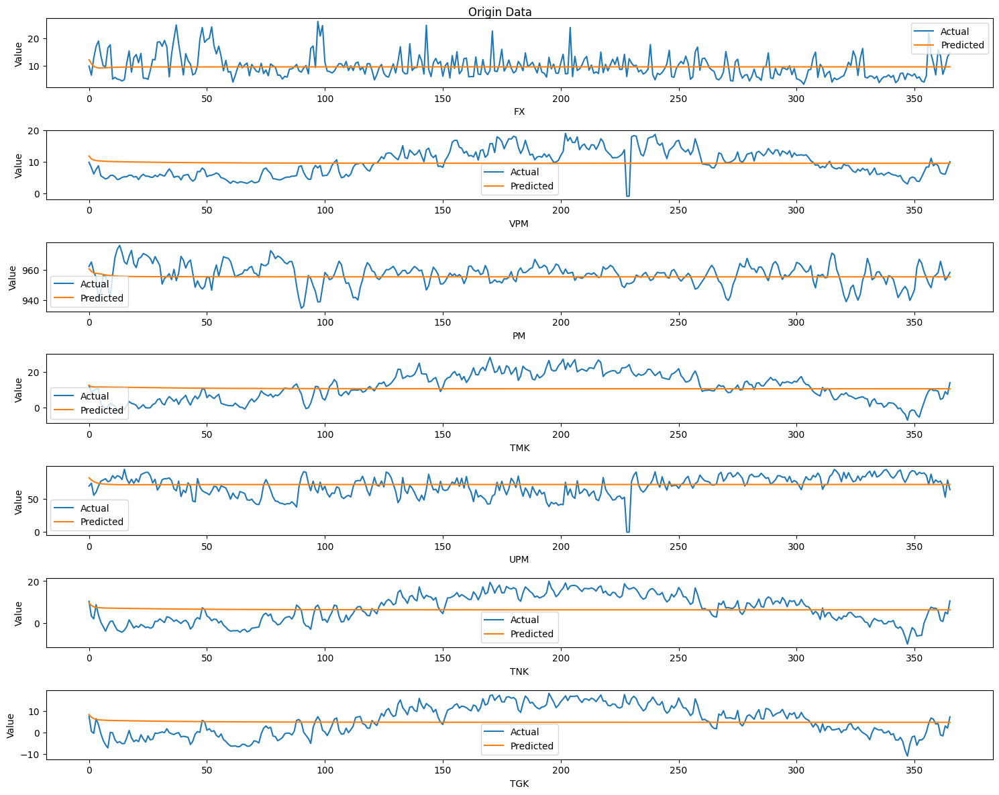

In [ ]:
plt.figure(figsize=(15, 15))
for i, col in enumerate(cols):
    plt.subplot(9, 1, i+1)
    plt.plot(VAR_test_df.iloc[:, i], label='Actual')
    plt.plot(inverse_VAR.iloc[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{col}')
    plt.ylabel('Value')
    plt.legend()

plt.suptitle('Origin Data')
plt.tight_layout()
plt.show()

# CNN
### Split data

In [ ]:
def to_sequences_multivariate(dataset, p):
    x = []
    y = []
    for i in range(p, len(dataset)):
        x.append(dataset.iloc[i - p:i, 0:dataset.shape[1]])
        y.append(dataset.iloc[i:i + 1, 0:dataset.shape[1]])
    x = np.array(x)
    y = np.array(y)
    return x,y.reshape(y.shape[0], y.shape[2])

In [ ]:
def difference(dataset, order=1):
    return dataset.diff(periods=order).dropna()

VAR_train_diff = difference(VAR_train, order=1)
VAR_test_diff = difference(VAR_test, order=1)

In [ ]:
p = 3

trainX, trainY = to_sequences_multivariate(VAR_train_diff, p)
testX, testY = to_sequences_multivariate(VAR_test_diff, p)

### Find optimal parameters

In [ ]:
def build_cnn_model(filters, kernel_size, n_past, n_features):
    with strategy.scope():
        inputs = layers.Input(shape=(n_past, n_features), name='input_layer') # (batch_size, n_past, n_features)
        
        # Reshape input to (samples, n_past, n_features, 1) to work with Conv2D
        x = layers.Reshape((n_past, n_features, 1), name='reshape_layer')(inputs)
        
        # Lớp 1: Conv2D với kernel_size (7, n_features) và padding='same'
        conv1 = layers.Conv2D(
            filters=filters,  # Số lượng filter
            kernel_size=(kernel_size, n_features),  # Kích thước kernel (7, n_features)
            activation='relu',
            padding='same', 
            name='conv1_layer')(x) # (batch_size, n_past, n_features, filters)
        
        # Batch Normalization sau lớp Conv1
        conv1 = layers.BatchNormalization(name='conv1_bn')(conv1)
        
        # MaxPooling sau lớp Conv1 với pool_size (2, 2)
        pool1 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool1')(conv1)
        
        # Lớp 2: Conv2D với kernel_size (3, 3) và padding='same'
        conv2 = layers.Conv2D(
            filters=filters,  # Số lượng filter
            kernel_size=(3, 3),  # Kích thước kernel (3, 3)
            activation='relu',
            padding='same', 
            name='conv2_layer')(pool1)
        
        # Batch Normalization sau lớp Conv2
        conv2 = layers.BatchNormalization(name='conv2_bn')(conv2)
        
        # MaxPooling sau lớp Conv2 với pool_size (2, 2)
        pool2 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool2')(conv2)
        
        # Flatten để đưa đầu ra vào lớp Dense
        flatten = layers.Flatten(name='flatten')(pool2)
        
        # Output layer: dự đoán cho mỗi đặc trưng (n_features)
        outputs = layers.Dense(n_features, name='output')(flatten)
        
        # Tạo và biên dịch mô hình
        model_CNN = tf.keras.models.Model(inputs, outputs)
        model_CNN.compile(optimizer='adam', loss='mse', metrics=['mae'])
    
    return model_CNN

In [ ]:
print('Starting find optimal parameters for CNN model')

# Tập giá trị tham số cần quét
param_grid = {
    'batch_size': [16, 32, 64],
    'filters': [16, 32, 64],
    'kernel_size': [5, 7, 10]
}

# Lưu kết quả
results = []
grid = ParameterGrid(param_grid)

# Lặp qua từng tổ hợp tham số
for params in grid:
    print(f"Testing with parameters: {params}")
    model = build_cnn_model(params['filters'], params['kernel_size'], p, 7)
    
    # Huấn luyện mô hình
    history = model.fit(
        trainX, trainY,
        batch_size=params['batch_size'],
        epochs=5,
        verbose=0,
        validation_split=0.2
    )
    
    # Lưu kết quả
    loss = history.history['loss'][-1]
    val_loss = history.history['val_loss'][-1]
    results.append({
        'batch_size': params['batch_size'],
        'filters': params['filters'],
        'kernel_size': params['kernel_size'],
        'loss': loss,
        'val_loss': val_loss
    })

# Sắp xếp kết quả theo val_loss
results = sorted(results, key=lambda x: x['val_loss'])

# Hiển thị kết quả tốt nhất
print("Best parameters:", results[0])
best_para_CNN = results[0]

Starting find optimal parameters for CNN model
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 5}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 7}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 10}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 5}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 7}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 10}
Testing with parameters: {'batch_size': 16, 'filters': 64, 'kernel_size': 5}
Testing with parameters: {'batch_size': 16, 'filters': 64, 'kernel_size': 7}
Testing with parameters: {'batch_size': 16, 'filters': 64, 'kernel_size': 10}
Testing with parameters: {'batch_size': 32, 'filters': 16, 'kernel_size': 5}
Testing with parameters: {'batch_size': 32, 'filters': 16, 'kernel_size': 7}
Testing with parameters: {'batch_size': 32, 'filters': 16, 'kernel_size': 10}
Testing with parameters: 

### Model initialization


In [ ]:
class CNN:
    def __init__(self, n_past, n_features, best_para_CNN, strategy):
        self.n_past = n_past
        self.n_features = n_features
        self.best_para_CNN = best_para_CNN
        self.strategy = strategy

        # Build the CNN model using the best parameters
        with self.strategy.scope():
            self.model_CNN = self._build_model()

    def _build_model(self):
        filters = self.best_para_CNN['filters']
        kernel_size = self.best_para_CNN['kernel_size']
        
        inputs = layers.Input(shape=(self.n_past, self.n_features), name='input_layer')
        x = layers.Reshape((self.n_past, self.n_features, 1), name='reshape_layer')(inputs)

        conv1 = layers.Conv2D(
            filters=filters,
            kernel_size=(kernel_size, self.n_features),
            activation='relu',
            padding='same',
            name='conv1_layer')(x)
        conv1 = layers.BatchNormalization(name='conv1_bn')(conv1)
        pool1 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool1')(conv1)

        conv2 = layers.Conv2D(
            filters=filters,
            kernel_size=(3, 3),
            activation='relu',
            padding='same',
            name='conv2_layer')(pool1)
        conv2 = layers.BatchNormalization(name='conv2_bn')(conv2)
        pool2 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool2')(conv2)

        flatten = layers.Flatten(name='flatten')(pool2)
        outputs = layers.Dense(self.n_features, name='output')(flatten)

        model_CNN = tf.keras.models.Model(inputs, outputs)
        model_CNN.compile(optimizer='adam', loss='mse', metrics=['mae'])
        return model_CNN

    def train(self, trainX, trainY):
        print('Start training CNN')

        reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)
        early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        start = time.time()
        with self.strategy.scope():
            history_CNN = self.model_CNN.fit(
                trainX,
                trainY,
                validation_split=0.2,
                epochs=100,
                batch_size=self.best_para_CNN['batch_size'],
                verbose=0,
                callbacks=[reduce_lr, early_stop]
            )
        end = time.time()
        
        print('Complete training model')
        print(f'Training time: {end - start:.2f} seconds')
        return history_CNN

    def summary(self):
        self.model_CNN.summary()

    def plot_loss(self, history_CNN):
        loss = history_CNN.history['loss']
        val_loss = history_CNN.history['val_loss']
        epochs = range(1, len(loss) + 1)

        plt.figure(figsize=(10, 6))
        plt.plot(epochs, loss, 'bo-', label='Training loss')
        plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

    def predict(self, testX):
        # Phương thức dự đoán
        return self.model_CNN.predict(testX)

In [ ]:
model_CNN = CNN(p, 7, best_para_CNN, strategy)
model_CNN.summary()

Model: "functional_385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 3, 7)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_layer (Reshape)         │ (None, 3, 7, 1)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_layer (Conv2D)            │ (None, 3, 7, 64)       │         4,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_bn (BatchNormalization)   │ (None, 3, 7, 64)       │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 2, 4, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2_layer (Conv2D)            │ (None, 2, 4, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2_bn (BatchNormalization)   │ (None, 2, 4, 64)       │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 1, 2, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 42,887 (167.53 KB)

 Trainable params: 42,631 (166.53 KB)

 Non-trainable params: 256 (1.00 KB)

### Model training

In [ ]:
history_CNN = model_CNN.train(trainX, trainY)

Start training CNN
Complete training model
Training time: 25.48 seconds


In [ ]:
pred_CNN = model_CNN.predict(testX)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


In [ ]:
def reverse_difference(original_data, differenced_data, order=1):
    reversed_data = []
    last_original_value = original_data.iloc[-len(differenced_data) - order:-order].values
    for i in range(len(differenced_data)):
        restored = differenced_data[i] + last_original_value[i]
        reversed_data.append(restored)
    return np.array(reversed_data)

In [ ]:
last_test_values = VAR_test.iloc[p:]
testY_original = reverse_difference(last_test_values, testY)
pred_CNN_original = reverse_difference(last_test_values, pred_CNN)

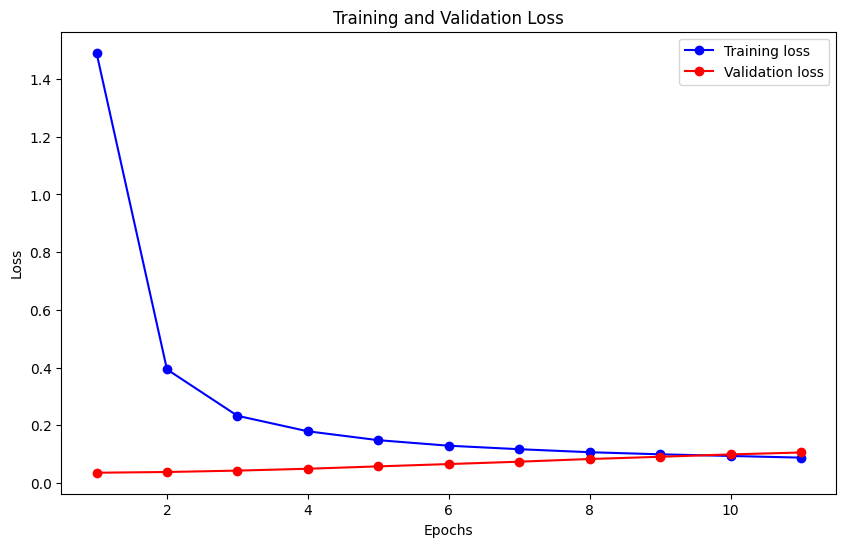

In [ ]:
model_CNN.plot_loss(history_CNN)

### Model Score
#### Scaled data

In [ ]:
for i in range(7):
    print(f'MSE for {VAR_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_CNN_original[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY_original, pred_CNN_original)}')

MSE for FX: 0.14114477950426688
MSE for VPM: 0.09337114929882247
MSE for PM: 0.09106052078558798
MSE for TMK: 0.07609518341160834
MSE for UPM: 0.11266792100319611
MSE for TNK: 0.07439806777538455
MSE for TGK: 0.061288995991604055
MSE total: 0.09286094539578148


In [ ]:
for i in range(7):
    print(f'RMSE for {VAR_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_CNN_original[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY_original, pred_CNN_original, squared=False)}')

RMSE for FX: 0.37569240011512994
RMSE for VPM: 0.3055669309641056
RMSE for PM: 0.3017623581323356
RMSE for TMK: 0.2758535542848929
RMSE for UPM: 0.33566042513706634
RMSE for TNK: 0.27276009197715223
RMSE for TGK: 0.24756614467976848
RMSE total: 0.30212312932720725


In [ ]:
for i in range(7):
    print(f'MAE for {VAR_test.columns[i]}: {mean_absolute_error(testY_original[:, i], pred_CNN_original[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY_original, pred_CNN_original)}')

MAE for FX: 0.2928207996851162
MAE for VPM: 0.2340088153518634
MAE for PM: 0.22200875688132493
MAE for TMK: 0.22030470947726183
MAE for UPM: 0.2573371770314094
MAE for TNK: 0.20802814179827736
MAE for TGK: 0.1885435554300527
MAE total: 0.2318645650936151


In [ ]:
for i in range(7):
    print(f'R2 for {VAR_test.columns[i]}: {r2_score(testY_original[:, i], pred_CNN_original[:, i])}')
    
print(f'R2 total: {r2_score(testY_original, pred_CNN_original)}')

R2 for FX: -0.012811939159982355
R2 for VPM: 0.4551179590331642
R2 for PM: 0.1987552774629895
R2 for TMK: 0.5908449256431667
R2 for UPM: -0.14411705643181838
R2 for TNK: 0.6174576509050014
R2 for TGK: 0.7230364350089387
R2 total: 0.34689760749449394


#### Unscaled data

In [ ]:
unscaled_CNN = unscale(pred_CNN_original)
originY = unscale(testY_original)

In [ ]:
for i in range(7):
    print(f'MSE for {VAR_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_CNN[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_CNN)}')

MSE for FX: 30.086421019828755
MSE for VPM: 19.902993674818713
MSE for PM: 19.41046052608242
MSE for TMK: 16.220449069204186
MSE for UPM: 24.016293455061522
MSE for TNK: 15.858692106752885
MSE for TGK: 13.06436241600521
MSE total: 19.794238895393388


In [ ]:
for i in range(7):
    print(f'RMSE for {VAR_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_CNN[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_CNN, squared=False)}')

RMSE for FX: 5.485109025336575
RMSE for VPM: 4.461277134948995
RMSE for PM: 4.405730419133974
RMSE for TMK: 4.027461864400976
RMSE for UPM: 4.900642147215151
RMSE for TNK: 3.982297340324161
RMSE for TGK: 3.6144657165347702
RMSE total: 4.4109976639849435


In [ ]:
for i in range(7):
    print(f'MAE for {VAR_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_CNN[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_CNN)}')

MAE for FX: 4.275183665040642
MAE for VPM: 3.4165286546991145
MAE for PM: 3.241327844128194
MAE for TMK: 3.216448740322942
MAE for UPM: 3.7571227243591605
MAE for TNK: 3.0372108623929996
MAE for TGK: 2.7527359229176414
MAE total: 3.385222630551528


### Plot predict data

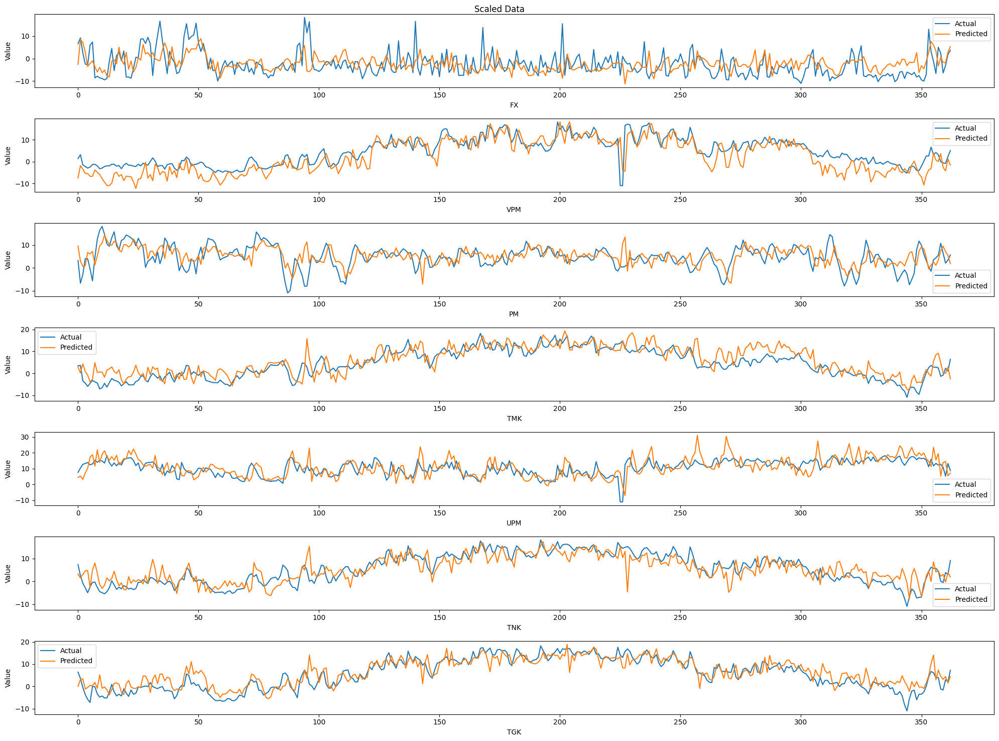

In [ ]:
plt.figure(figsize=(20, 15))
for i in range(7):
    plt.subplot(7, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_CNN[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{VAR_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

# LSTM
### Find optimal parameters

In [ ]:
print('Starting find optimal parameters for LSTM model')
def build_lstm_model(n_units, n_past, n_features):
    inputs = tf.keras.layers.Input(shape=(n_past, n_features))
    lstm = tf.keras.layers.LSTM(n_units, return_state=True)
    _, state_h, _ = lstm(inputs)
    outputs = tf.keras.layers.Dense(n_features)(state_h)
    
    model_LSTM = tf.keras.models.Model(inputs, outputs)
    model_LSTM.compile(optimizer='adam', loss='mse', metrics=['mae'])
    
    return model_LSTM

# Tập giá trị tham số cần quét
param_grid = {
    'batch_size': [16, 32, 64],
    'units': [32, 64, 128]
}

# Lưu tham số và kết quả
results = []
grid = ParameterGrid(param_grid)

# Lặp qua từng tham số
for params in grid:
    print(f"Testing with parameters: {params}")
    model = build_lstm_model(params['units'], p, 7)
    
    # Huấn luyện mô hình
    history = model.fit(
        trainX, trainY,
        batch_size=params['batch_size'],
        epochs=5,
        verbose=0
    )
    
    # Lưu lại kết quả
    loss = history.history['loss'][-1]
    mae = history.history['mae'][-1]
    results.append({
        'batch_size': params['batch_size'],
        'units': params['units'],
        'loss': loss,
        'mae': mae
    })

# Sắp xếp kết quả theo loss
results = sorted(results, key=lambda x: x['loss'])

# Hiển thị kết quả tốt nhất
print("Best parameters:", results[0])
best_para_LSTM = results[0]

Starting find optimal parameters for LSTM model
Testing with parameters: {'batch_size': 16, 'units': 32}
Testing with parameters: {'batch_size': 16, 'units': 64}
Testing with parameters: {'batch_size': 16, 'units': 128}
Testing with parameters: {'batch_size': 32, 'units': 32}
Testing with parameters: {'batch_size': 32, 'units': 64}
Testing with parameters: {'batch_size': 32, 'units': 128}
Testing with parameters: {'batch_size': 64, 'units': 32}
Testing with parameters: {'batch_size': 64, 'units': 64}
Testing with parameters: {'batch_size': 64, 'units': 128}
Best parameters: {'batch_size': 16, 'units': 128, 'loss': 0.09402834624052048, 'mae': 0.2019689530134201}


### Model initialization

In [ ]:
class LSTM_Model:
    def __init__(self, n_past, n_features, best_para_LSTM, strategy):
        self.n_past = n_past
        self.n_features = n_features
        self.best_para_LSTM = best_para_LSTM
        self.strategy = strategy

        # Xây dựng mô hình LSTM
        with self.strategy.scope():
            self.model_LSTM = self._build_model()

    def _build_model(self):
        inputs = tf.keras.layers.Input(shape=(self.n_past, self.n_features))
        
        # Lớp LSTM
        lstm = tf.keras.layers.LSTM(self.best_para_LSTM['units'], return_state=True)
        _, state_h, state_c = lstm(inputs)
        
        # Lớp Dense để đưa ra kết quả dự đoán
        outputs = tf.keras.layers.Dense(self.n_features)(state_h)

        # Tạo mô hình
        model = tf.keras.models.Model(inputs, outputs)
        return model

    def train(self, trainX, trainY):
        print('Start training LSTM')

        reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)
        early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        with self.strategy.scope():
            self.model_LSTM.compile(optimizer=tf.keras.optimizers.Adam(), loss=tf.keras.losses.Huber())

        start = time.time()
        history_LSTM = self.model_LSTM.fit(
            trainX,
            trainY,
            epochs=50,
            validation_split=0.2,
            batch_size=self.best_para_LSTM['batch_size'],
            verbose=0,
            callbacks=[reduce_lr, early_stopping]
        )
        end = time.time()
        print('Complete training model')
        print(f'Training time: {end - start:.2f} seconds')
        return history_LSTM

    def summary(self):
        self.model_LSTM.summary()

    def plot_loss(self, history_LSTM):
        loss = history_LSTM.history['loss']
        val_loss = history_LSTM.history['val_loss']
        epochs = range(1, len(loss) + 1)

        plt.figure(figsize=(10, 6))
        plt.plot(epochs, loss, 'bo-', label='Training loss')
        plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

    def predict(self, testX):
        # Phương thức dự đoán
        return self.model_LSTM.predict(testX)

In [ ]:
lstm_model = LSTM_Model(n_past=p, n_features=7, best_para_LSTM=best_para_LSTM, strategy=strategy)
lstm_model.summary()

Model: "functional_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_37 (InputLayer)     │ (None, 3, 7)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_9 (LSTM)                   │ [(None, 128), (None,   │        69,632 │
│                                 │ 128), (None, 128)]     │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 70,535 (275.53 KB)

 Trainable params: 70,535 (275.53 KB)

 Non-trainable params: 0 (0.00 B)

### Model training

In [ ]:
history = lstm_model.train(trainX, trainY)

Start training LSTM
Complete training model
Training time: 23.63 seconds


In [ ]:
pred_LSTM = lstm_model.predict(testX)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


In [ ]:
last_test_values = VAR_test.iloc[p:]
testY_original = reverse_difference(last_test_values, testY)
pred_LSTM_original = reverse_difference(last_test_values, pred_LSTM)

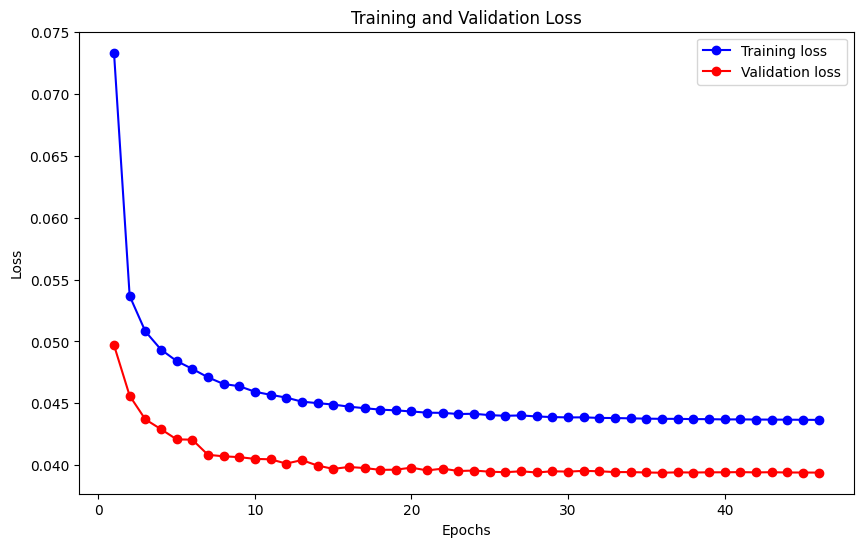

In [ ]:
lstm_model.plot_loss(history)

### Model Score
#### Scaled data

In [ ]:
for i in range(7):
    print(f'MSE for {VAR_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_LSTM_original[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY_original, pred_LSTM_original)}')

MSE for FX: 0.1148646978632944
MSE for VPM: 0.07634333644096271
MSE for PM: 0.04423038541851988
MSE for TMK: 0.023169527350765256
MSE for UPM: 0.09710055652035589
MSE for TNK: 0.022469100097355595
MSE for TGK: 0.028411427462705297
MSE total: 0.058084147307708424


In [ ]:
for i in range(7):
    print(f'RMSE for {VAR_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_LSTM_original[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY_original, pred_LSTM_original, squared=False)}')

RMSE for FX: 0.3389169483270118
RMSE for VPM: 0.2763029794283129
RMSE for PM: 0.21031021234956682
RMSE for TMK: 0.1522153978767104
RMSE for UPM: 0.3116096219957848
RMSE for TNK: 0.1498969649371047
RMSE for TGK: 0.1685568968114485
RMSE total: 0.22968700310370568


In [ ]:
for i in range(7):
    print(f'MAE for {VAR_test.columns[i]}: {mean_absolute_error(testY_original[:, i], pred_LSTM_original[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY_original, pred_LSTM_original)}')

MAE for FX: 0.26832430181130645
MAE for VPM: 0.23071857413477148
MAE for PM: 0.15588024037773895
MAE for TMK: 0.12059834693106979
MAE for UPM: 0.25331520620293924
MAE for TNK: 0.11881033135276556
MAE for TGK: 0.13746768081154237
MAE total: 0.18358781166030477


In [ ]:
for i in range(7):
    print(f'R2 for {VAR_test.columns[i]}: {r2_score(testY_original[:, i], pred_LSTM_original[:, i])}')
    
print(f'R2 total: {r2_score(testY_original, pred_LSTM_original)}')

R2 for FX: 0.1757659206911597
R2 for VPM: 0.5544864416197759
R2 for PM: 0.6108152843117065
R2 for TMK: 0.8754201085929852
R2 for UPM: 0.013965981489890922
R2 for TNK: 0.8844676671006643
R2 for TGK: 0.8716094119467422
R2 total: 0.5695044022504175


#### Unscaled data

In [ ]:
unscaled_LSTM = unscale(pred_LSTM_original)
originY = unscale(testY_original)

In [ ]:
for i in range(7):
    print(f'MSE for {VAR_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_LSTM[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_LSTM)}')

MSE for FX: 24.484559090344536
MSE for VPM: 16.273345106973256
MSE for PM: 9.428148918522531
MSE for TMK: 4.938816506747561
MSE for UPM: 20.697954142136144
MSE for TNK: 4.78951326823922
MSE for TGK: 6.0561798246331895
MSE total: 12.381216693942347


In [ ]:
for i in range(7):
    print(f'RMSE for {VAR_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_LSTM[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_LSTM, squared=False)}')

RMSE for FX: 4.948187455053066
RMSE for VPM: 4.0340234390708805
RMSE for PM: 3.0705290942315675
RMSE for TMK: 2.2223448217474178
RMSE for UPM: 4.549500427754254
RMSE for TNK: 2.188495663290019
RMSE for TGK: 2.460930682614443
RMSE total: 3.353430226251664


In [ ]:
for i in range(7):
    print(f'MAE for {VAR_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_LSTM[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_LSTM)}')

MAE for FX: 3.9175348185044827
MAE for VPM: 3.368491115425328
MAE for PM: 2.275851507622069
MAE for TMK: 1.760735866640632
MAE for UPM: 3.6984019608020673
MAE for TNK: 1.7346308097824779
MAE for TGK: 2.007028118767275
MAE total: 2.6803820282206194


### Plot predict data

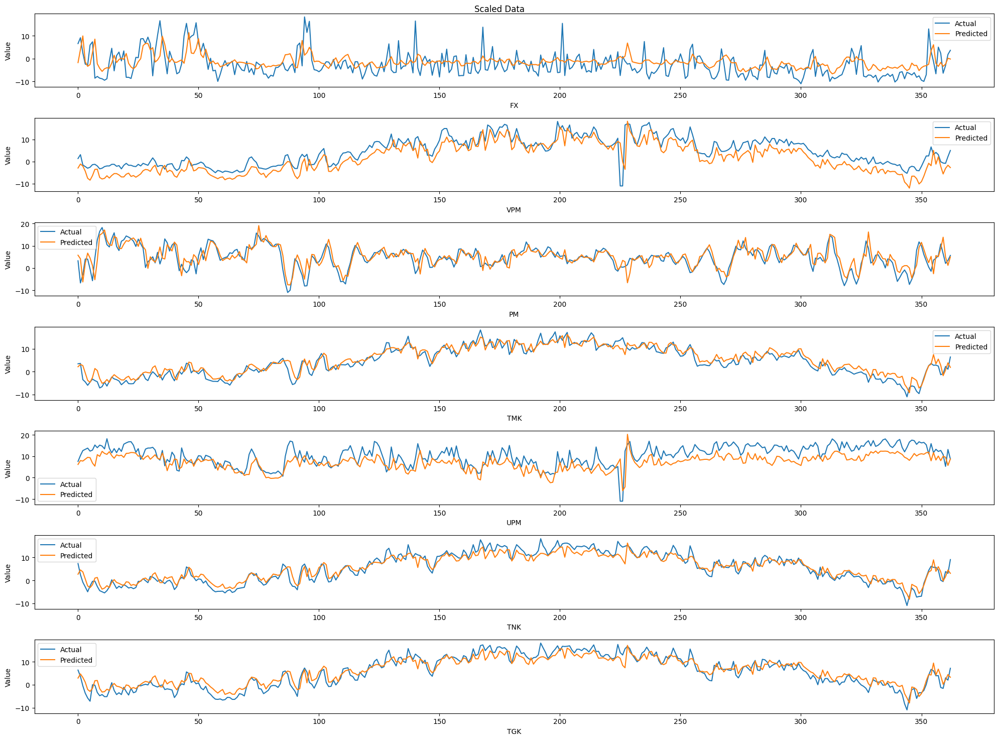

In [ ]:
plt.figure(figsize=(20, 15))
for i in range(7):
    plt.subplot(7, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_LSTM[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{VAR_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

# CNN + LSTM
### Find optimal parameters

In [ ]:
def build_cnn_lstm_model(filters, kernel_size, lstm_units, n_past, n_features):
    with strategy.scope():
        inputs = layers.Input(shape=(n_past, n_features), name='input_layer')
        x = layers.Reshape((n_past, n_features, 1), name='reshape_layer')(inputs)
    
        conv1 = layers.Conv2D(
            filters=filters,
            kernel_size=(kernel_size, n_features),
            activation='relu',
            padding='same',
            name='conv1')(x)
        conv1_bn = layers.BatchNormalization(name='conv1_bn')(conv1)
        pool1 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool1')(conv1_bn)
    
        conv2 = layers.Conv2D(
            filters=filters,
            kernel_size=(3, 3),
            activation='relu',
            padding='same',
            name='conv2')(pool1)
        conv2_bn = layers.BatchNormalization(name='conv2_bn')(conv2)
        pool2 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool2')(conv2_bn)
    
        flatten = layers.Flatten(name='flatten')(pool2)
    
        lstm_input = layers.Reshape((1, flatten.shape[-1]), name='lstm_input')(flatten)
    
        lstm = layers.LSTM(lstm_units, return_state=True, name='lstm')
        _, state_h, _ = lstm(lstm_input)
        
        outputs = layers.Dense(n_features, name='outputs')(state_h)
        
        model_CNN_LSTM = tf.keras.models.Model(inputs, outputs)
        model_CNN_LSTM.compile(optimizer='adam', loss='mse', metrics=['mae'])
        
    return model_CNN_LSTM

In [ ]:
print('Starting find optimal parameters for CNN + LSTM model')
# Tập giá trị tham số cần quét
param_grid = {
    'filters': [16, 32, 64],
    'kernel_size': [5, 7, 10],
    'lstm_units': [32, 64, 128],
    'batch_size': [16, 32, 64]
}

# Lưu kết quả
results = []
grid = ParameterGrid(param_grid)

# Lặp qua từng tổ hợp tham số
for params in grid:
    print(f"Testing with parameters: {params}")
    cnn_lstm_model = build_cnn_lstm_model(params['filters'], params['kernel_size'], 
                                 params['lstm_units'], p, 7)
    with strategy.scope():
        # Huấn luyện mô hình
        history = cnn_lstm_model.fit(
            trainX, trainY,
            batch_size=params['batch_size'],
            epochs=5,
            verbose=0,
            validation_split=0.2
        )
    
    # Lưu kết quả
    loss = history.history['loss'][-1]
    val_loss = history.history['val_loss'][-1]
    results.append({
        'filters': params['filters'],
        'kernel_size': params['kernel_size'],
        'lstm_units': params['lstm_units'],
        'batch_size': params['batch_size'],
        'loss': loss,
        'val_loss': val_loss
    })

# Sắp xếp kết quả theo val_loss
results = sorted(results, key=lambda x: x['val_loss'])

# Hiển thị kết quả tốt nhất
print("Best parameters:", results[0])
best_para_cnn_lstm = results[0]

Starting find optimal parameters for CNN + LSTM model
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 5, 'lstm_units': 32}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 5, 'lstm_units': 64}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 5, 'lstm_units': 128}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 7, 'lstm_units': 32}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 7, 'lstm_units': 64}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 7, 'lstm_units': 128}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 10, 'lstm_units': 32}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 10, 'lstm_units': 64}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 10, 'lstm_units': 128}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 5, 'lstm_un

### Model initialization

In [ ]:
class CNN_LSTM_Model:
    def __init__(self, n_past, n_features, best_para_cnn_lstm, strategy):
        self.n_past = n_past
        self.n_features = n_features
        self.best_para_cnn_lstm = best_para_cnn_lstm
        self.strategy = strategy

        # Xây dựng mô hình CNN + LSTM
        with self.strategy.scope():
            self.model_CNN_LSTM = self._build_model()

    def _build_model(self):
        filters = self.best_para_cnn_lstm['filters']
        kernel_size = self.best_para_cnn_lstm['kernel_size']
        lstm_units = self.best_para_cnn_lstm['lstm_units']
        with strategy.scope():
            inputs = layers.Input(shape=(self.n_past, self.n_features), name='input_layer')
            x = layers.Reshape((self.n_past, self.n_features, 1), name='reshape_layer')(inputs)
        
            conv1 = layers.Conv2D(
                filters=filters,
                kernel_size=(kernel_size, self.n_features),
                activation='relu',
                padding='same',
                name='conv1')(x)
            conv1_bn = layers.BatchNormalization(name='conv1_bn')(conv1)
            pool1 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool1')(conv1_bn)
        
            conv2 = layers.Conv2D(
                filters=filters,
                kernel_size=(3, 3),
                activation='relu',
                padding='same',
                name='conv2')(pool1)
            conv2_bn = layers.BatchNormalization(name='conv2_bn')(conv2)
            pool2 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool2')(conv2_bn)
        
            flatten = layers.Flatten(name='flatten')(pool2)
        
            lstm_input = layers.Reshape((1, flatten.shape[-1]), name='lstm_input')(flatten)
        
            lstm = layers.LSTM(lstm_units, return_state=True, name='lstm')
            _, state_h, _ = lstm(lstm_input)
            
            outputs = layers.Dense(self.n_features, name='outputs')(state_h)
            
            model_CNN_LSTM = tf.keras.models.Model(inputs, outputs)
            model_CNN_LSTM.compile(optimizer='adam', loss='mse', metrics=['mae'])
            
        return model_CNN_LSTM

    def train(self, trainX, trainY):
        print('Start training CNN + LSTM')

        reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)
        early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        start = time.time()
        with self.strategy.scope():        
            history_CNN_LSTM = self.model_CNN_LSTM.fit(
                trainX,
                trainY,
                epochs=100,
                validation_split=0.2,
                batch_size=self.best_para_cnn_lstm['batch_size'],
                verbose=0,
                callbacks=[reduce_lr, early_stopping]
            )
        end = time.time()
        print('Complete training model')
        print(f'Training time: {end - start:.2f} seconds')
        return history_CNN_LSTM

    def summary(self):
        self.model_CNN_LSTM.summary()

    def plot_loss(self, history_CNN_LSTM):
        loss = history_CNN_LSTM.history['loss']
        val_loss = history_CNN_LSTM.history['val_loss']
        epochs = range(1, len(loss) + 1)

        plt.figure(figsize=(10, 6))
        plt.plot(epochs, loss, 'bo-', label='Training loss')
        plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

    def predict(self, testX):
        # Phương thức dự đoán
        return self.model_CNN_LSTM.predict(testX)

In [ ]:
cnn_lstm_model = CNN_LSTM_Model(n_past=p, n_features=7, best_para_cnn_lstm=best_para_cnn_lstm, strategy=strategy)
cnn_lstm_model.summary()

Model: "functional_383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 3, 7)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_layer (Reshape)         │ (None, 3, 7, 1)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 3, 7, 16)       │           576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_bn (BatchNormalization)   │ (None, 3, 7, 16)       │            64 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 2, 4, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 2, 4, 16)       │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2_bn (BatchNormalization)   │ (None, 2, 4, 16)       │            64 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 1, 2, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_input (Reshape)            │ (None, 1, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ [(None, 32), (None,    │         8,320 │
│                                 │ 32), (None, 32)]       │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ outputs (Dense)                 │ (None, 7)              │           231 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,575 (45.21 KB)

 Trainable params: 11,511 (44.96 KB)

 Non-trainable params: 64 (256.00 B)

### Model training

In [ ]:
history = cnn_lstm_model.train(trainX, trainY)

Start training CNN + LSTM
Complete training model
Training time: 16.66 seconds


In [ ]:
pred_CNN_LSTM = cnn_lstm_model.predict(testX)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


In [ ]:
last_test_values = VAR_test.iloc[p:]
testY_original = reverse_difference(last_test_values, testY)
pred_CNN_LSTM_original = reverse_difference(last_test_values, pred_CNN_LSTM)

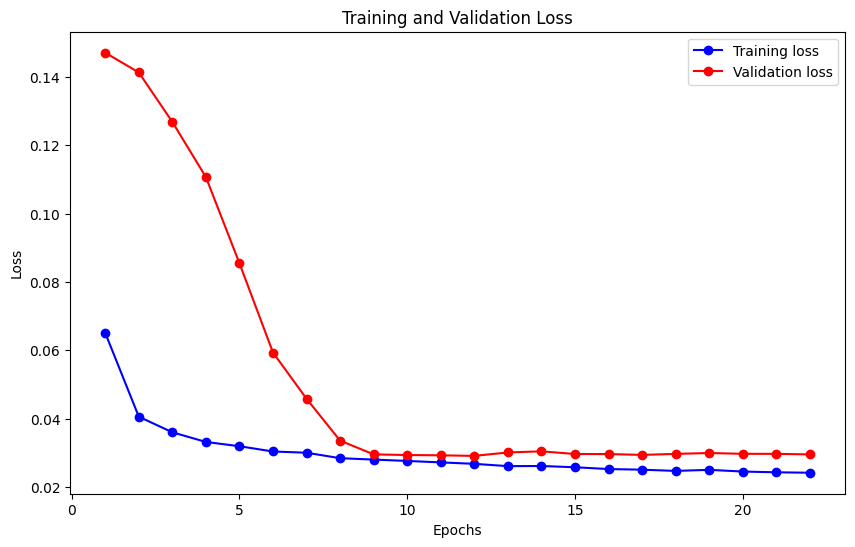

In [ ]:
cnn_lstm_model.plot_loss(history)

### Model Score
#### Scaled data

In [ ]:
for i in range(7):
    print(f'MSE for {VAR_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_CNN_LSTM_original[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY_original, pred_CNN_LSTM_original)}')

MSE for FX: 0.11480185093736861
MSE for VPM: 0.0700288581049424
MSE for PM: 0.07640584444344806
MSE for TMK: 0.022715581813708526
MSE for UPM: 0.09116154859195294
MSE for TNK: 0.02453013173321746
MSE for TGK: 0.02828233195302044
MSE total: 0.06113230679680831


In [ ]:
for i in range(7):
    print(f'RMSE for {VAR_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_CNN_LSTM_original[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY_original, pred_CNN_LSTM_original, squared=False)}')

RMSE for FX: 0.33882421834539606
RMSE for VPM: 0.26462966217894474
RMSE for PM: 0.27641607124667705
RMSE for TMK: 0.1507168929274636
RMSE for UPM: 0.30192970803144387
RMSE for TNK: 0.15662098113987621
RMSE for TGK: 0.16817351739504185
RMSE total: 0.23675872160926328


In [ ]:
for i in range(7):
    print(f'MAE for {VAR_test.columns[i]}: {mean_absolute_error(testY_original[:, i], pred_CNN_LSTM_original[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY_original, pred_CNN_LSTM_original)}')

MAE for FX: 0.25564767807602545
MAE for VPM: 0.21509326852221794
MAE for PM: 0.20120304099947284
MAE for TMK: 0.11528358441976529
MAE for UPM: 0.22690672617419613
MAE for TNK: 0.11866127414776136
MAE for TGK: 0.13494383559334416
MAE total: 0.1811056297046833


In [ ]:
for i in range(7):
    print(f'R2 for {VAR_test.columns[i]}: {r2_score(testY_original[:, i], pred_CNN_LSTM_original[:, i])}')
    
print(f'R2 total: {r2_score(testY_original, pred_CNN_LSTM_original)}')

R2 for FX: 0.17621689108581895
R2 for VPM: 0.5913355740253359
R2 for PM: 0.3277022896075321
R2 for TMK: 0.8778609216857632
R2 for UPM: 0.07427525327433127
R2 for TNK: 0.8738701891403218
R2 for TGK: 0.8721927915895015
R2 total: 0.5419219872012293


#### Unscaled data

In [ ]:
unscaled_CNN_LSTM = unscale(pred_CNN_LSTM_original)
originY = unscale(testY_original)

In [ ]:
for i in range(7):
    print(f'MSE for {VAR_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_CNN_LSTM[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_CNN_LSTM)}')

MSE for FX: 24.471162559138655
MSE for VPM: 14.927350826002993
MSE for PM: 16.286670186354538
MSE for TMK: 4.842053362676827
MSE for UPM: 19.431995897134076
MSE for TNK: 5.2288427225047664
MSE for TGK: 6.0286617710823105
MSE total: 13.030962474984879


In [ ]:
for i in range(7):
    print(f'RMSE for {VAR_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_CNN_LSTM[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_CNN_LSTM, squared=False)}')

RMSE for FX: 4.946833589190024
RMSE for VPM: 3.8635929943516296
RMSE for PM: 4.035674687874946
RMSE for TMK: 2.200466623849775
RMSE for UPM: 4.408173759861795
RMSE for TNK: 2.2866662901492134
RMSE for TGK: 2.4553333319698796
RMSE total: 3.456677325321038


In [ ]:
for i in range(7):
    print(f'MAE for {VAR_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_CNN_LSTM[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_CNN_LSTM)}')

MAE for FX: 3.73245610824595
MAE for VPM: 3.1403616339997007
MAE for PM: 2.937564442417316
MAE for TMK: 1.683140335599116
MAE for UPM: 3.312838213333503
MAE for TNK: 1.7324545633155393
MAE for TGK: 1.9701799773919004
MAE total: 2.6441421820432898


### Plot predict data

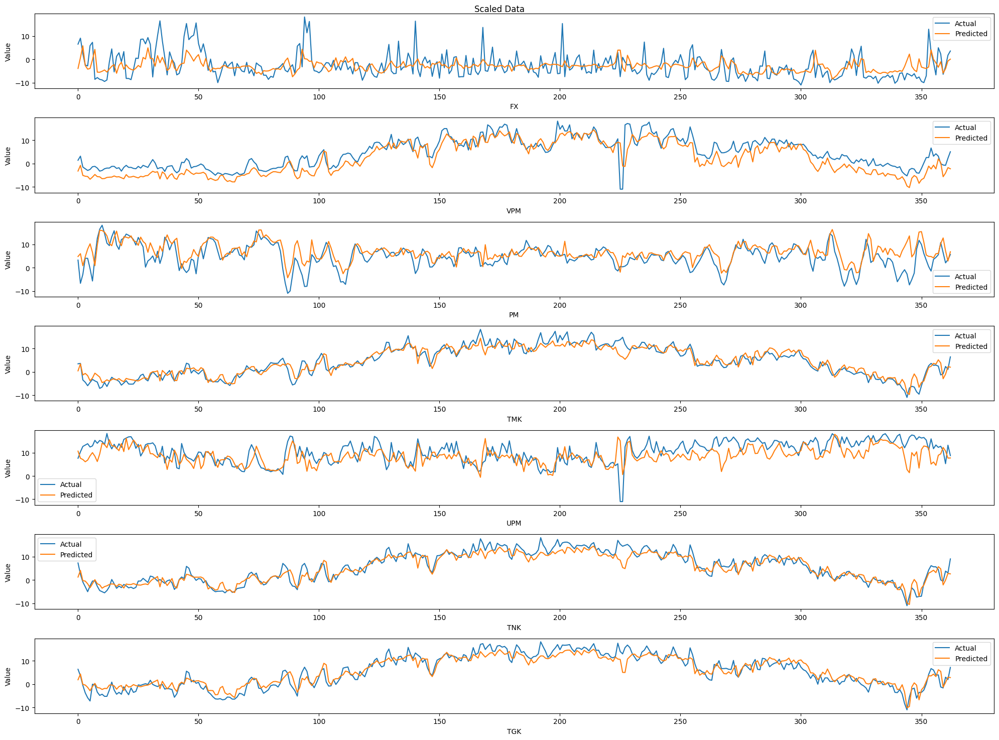

In [ ]:
plt.figure(figsize=(20, 15))
for i in range(7):
    plt.subplot(7, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_CNN_LSTM[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{VAR_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

## VAR-NN
### Defining model

In [ ]:
var_model = VAR(VAR_train_diff)
var_results = var_model.fit(p)
var_coefficients = var_results.params

In [ ]:
class VARNN(tf.keras.Model):
    def __init__(self, var_weights, var_bias, hidden_units):
        super(VARNN, self).__init__()
        self.ffnn_model = tf.keras.Sequential([
            tf.keras.layers.Flatten(input_shape=(p, 7)),  
            tf.keras.layers.Dense(hidden_units, activation='sigmoid')
        ])
        self.var_weights = tf.cast(var_weights, tf.float32)
        self.var_bias = tf.cast(var_bias, tf.float32)
        self.hidden_units = hidden_units

    def call(self, inputs):
        ffnn_output = self.ffnn_model(inputs)
        ffnn_output = tf.reshape(ffnn_output, [-1, self.hidden_units])
        var_output = tf.matmul(ffnn_output, self.var_weights) + self.var_bias
        return var_output

In [ ]:
num_outputs = 7
var_bias = var_coefficients.loc['const'].values
var_weights = var_coefficients.drop('const').values

In [ ]:
VARNN_model = VARNN(var_weights, var_bias, num_outputs * p)

reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

start = time.time()
VARNN_model.compile(optimizer='adam', loss='mse')
history = VARNN_model.fit(trainX, trainY, verbose=0, epochs=100, batch_size=32, validation_split=0.2, callbacks=[reduce_lr, early_stopping])
end = time.time()

In [ ]:
print(end-start)

13.458838939666748


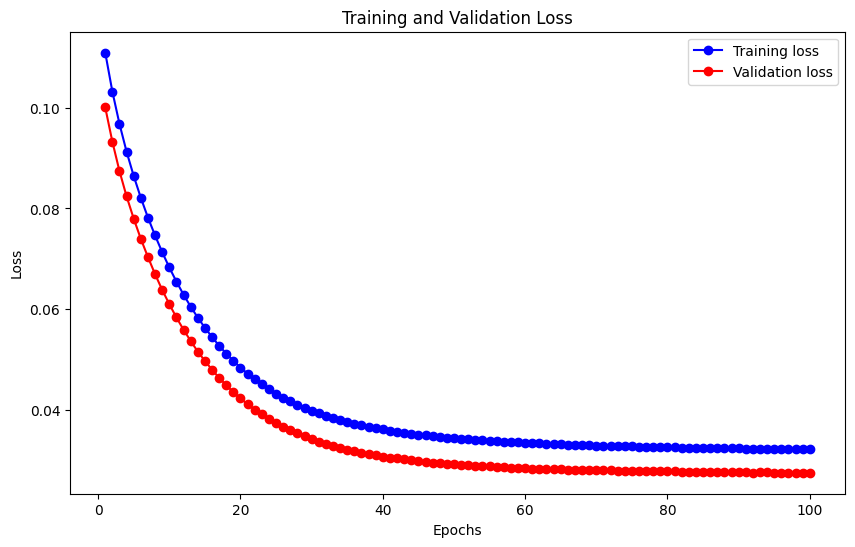

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs, loss, 'bo-', label='Training loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
def reverse_difference(original_data, differenced_data, order=1):
    reversed_data = []
    last_original_value = original_data.iloc[-len(differenced_data) - order:-order].values
    for i in range(len(differenced_data)):
        restored = differenced_data[i] + last_original_value[i]
        reversed_data.append(restored)
    return np.array(reversed_data)

In [ ]:
# Get predictions
pred_VARNN = VARNN_model.predict(testX)

# Reverse the differencing
last_test_values = VAR_test.iloc[p:]
testY_original = reverse_difference(last_test_values, testY)
pred_VARNN_original = reverse_difference(last_test_values, pred_VARNN)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


### Model Evaluation
#### Scaled data

In [ ]:
for i in range(num_outputs):
    print(f'MSE for {VAR_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_VARNN_original[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY_original, pred_VARNN_original)}')

MSE for FX: 0.17542365433008908
MSE for VPM: 0.056508104446251435
MSE for PM: 0.02378829055670526
MSE for TMK: 0.021977274522487336
MSE for UPM: 0.17552407500850667
MSE for TNK: 0.02182321567990031
MSE for TGK: 0.020051885491635665
MSE total: 0.07072807143365369


In [ ]:
for i in range(num_outputs):
    print(f'RMSE for {VAR_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_VARNN_original[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY_original, pred_VARNN_original, squared=False)}')

RMSE for FX: 0.418836070951499
RMSE for VPM: 0.23771433369961398
RMSE for PM: 0.1542345310126927
RMSE for TMK: 0.14824734237917161
RMSE for UPM: 0.41895593444717627
RMSE for TNK: 0.1477268278949369
RMSE for TGK: 0.1416046803309681
RMSE total: 0.23818853153086553


In [ ]:
for i in range(num_outputs):
    print(f'MAE for {VAR_test.columns[i]}: {mean_absolute_error(testY_original[:, i], pred_VARNN_original[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY_original, pred_VARNN_original)}')

MAE for FX: 0.36146734100504674
MAE for VPM: 0.16703435033515057
MAE for PM: 0.11860871024396483
MAE for TMK: 0.12292970216423629
MAE for UPM: 0.3201049743253696
MAE for TNK: 0.11437263695434192
MAE for TGK: 0.10875093081408092
MAE total: 0.18760980654888446


In [ ]:
for i in range(num_outputs):
    print(f'R2 for {VAR_test.columns[i]}: {r2_score(testY_original[:, i], pred_VARNN_original[:, i])}')
    
print(f'R2 total: {r2_score(testY_original, pred_VARNN_original)}')

R2 for FX: -1.813562367298947
R2 for VPM: 0.7214447942598003
R2 for PM: 0.6120084602094038
R2 for TMK: 0.8627694503638819
R2 for UPM: 0.22964209526891066
R2 for TNK: 0.850391398019329
R2 for TGK: 0.8723834765192724
R2 total: 0.3335824724773787


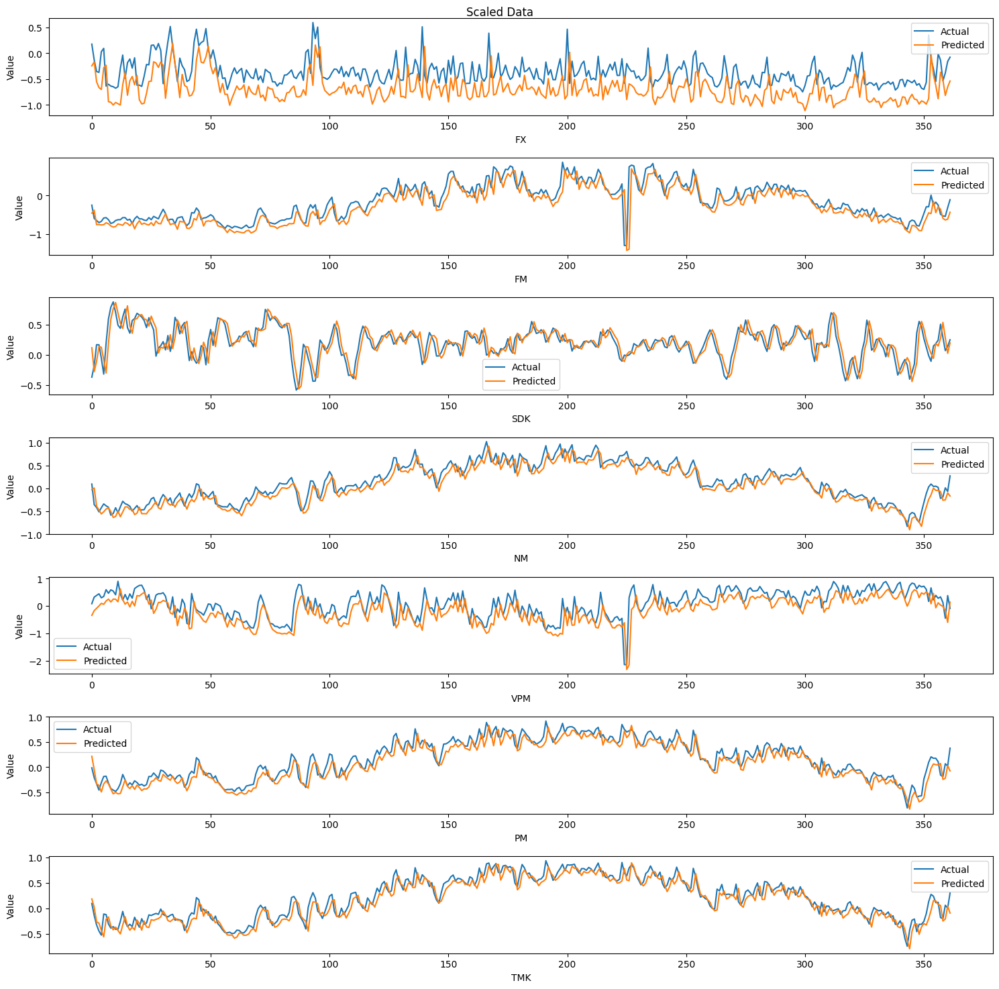

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(num_outputs):
    plt.subplot(num_outputs, 1, i+1)
    plt.plot(testY_original[:, i], label='Actual')
    plt.plot(pred_VARNN_original[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

#### Unscaled data

In [ ]:
def unscale(data):
    temp = data.copy()
    for index, i in enumerate(VAR_train.columns):
        scaler = scalers['scaler_' + i]
        temp[:, index] = scaler.inverse_transform(np.reshape(data[:, index], (-1, 1))).flatten()
    return temp

In [ ]:
unscaled_VARNN = unscale(pred_VARNN_original)
originY = unscale(testY_original)

In [ ]:
for i in range(num_outputs):
    print(f'MSE for {VAR_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_VARNN[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_VARNN)}')

MSE for FX: 50.697436101395745
MSE for VPM: 4.78284596033072
MSE for PM: 19.254301847323593
MSE for TMK: 8.017529518548606
MSE for UPM: 174.16376342719073
MSE for TNK: 6.607196779246616
MSE for TGK: 6.036068700405897
MSE total: 38.50844890492029


In [ ]:
for i in range(num_outputs):
    print(f'RMSE for {VAR_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_VARNN[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_VARNN, squared=False)}')

RMSE for FX: 7.120213206175483
RMSE for VPM: 2.1869718700364484
RMSE for PM: 4.387972407311103
RMSE for TMK: 2.8315242394421785
RMSE for UPM: 13.197111935086053
RMSE for TNK: 2.5704468053719016
RMSE for TGK: 2.4568412037422966
RMSE total: 4.964440238166495


In [ ]:
for i in range(num_outputs):
    print(f'MAE for {VAR_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_VARNN[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_VARNN)}')

MAE for FX: 6.1449447970857936
MAE for VPM: 1.5367160230833852
MAE for PM: 3.3744178064407975
MAE for TMK: 2.347957311336913
MAE for UPM: 10.083306691249144
MAE for TNK: 1.9900838830055492
MAE for TGK: 1.886828649624305
MAE total: 3.909179308832271


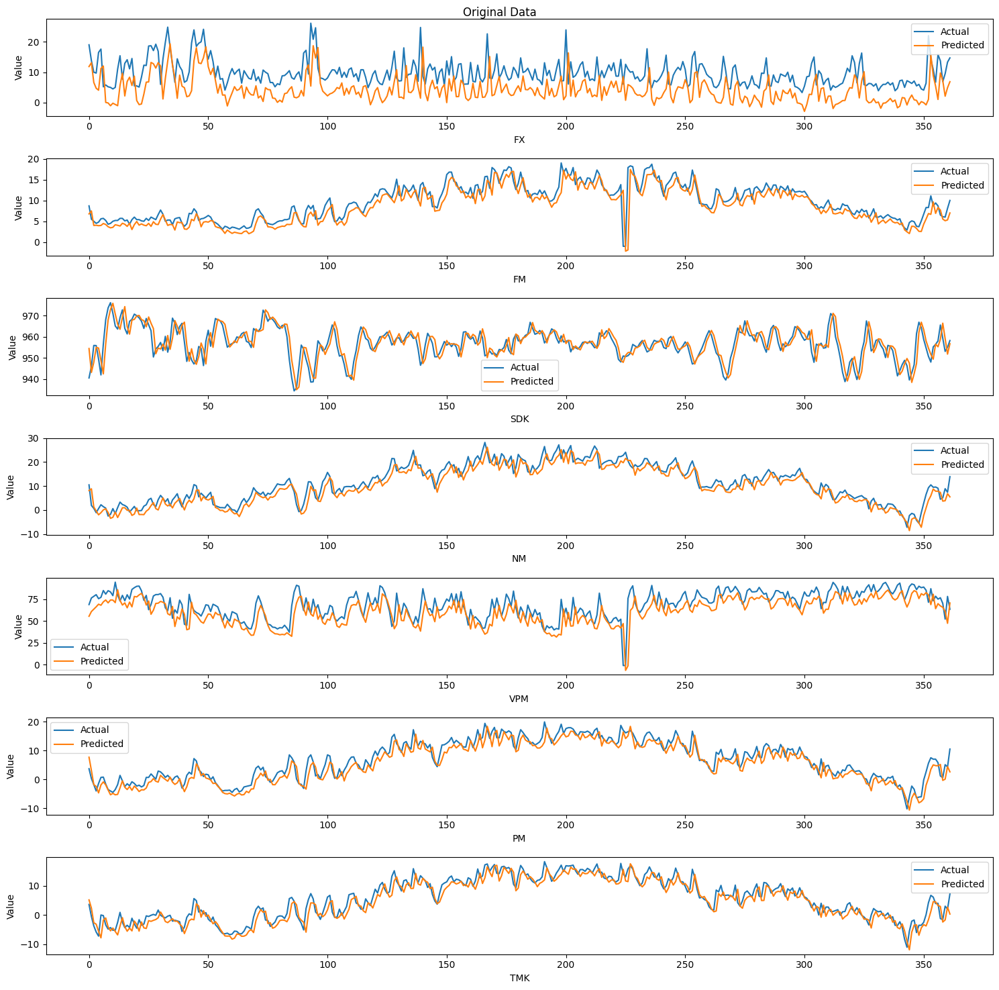

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(num_outputs):
    plt.subplot(num_outputs, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_VARNN[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Original Data')
plt.tight_layout()
plt.show()

## SrVAR
### Define model

In [ ]:
class LSTMEncoder(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(LSTMEncoder, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, batch_first=True)

    def forward(self, x):
        _, (h_n, _) = self.lstm(x)
        return h_n[-1] 

In [ ]:
class StateRegularizedUnit(nn.Module):
    def __init__(self, hidden_dim, num_states, tau=1.0):
        super(StateRegularizedUnit, self).__init__()
        self.state_encodings = nn.Parameter(torch.randn(num_states, hidden_dim))
        self.tau = tau

    def forward(self, u_t):
        # Proximity scores
        proximity_scores = torch.matmul(u_t, self.state_encodings.T)
        alpha = torch.softmax(proximity_scores / self.tau, dim=-1) 

        h_t = torch.matmul(alpha, self.state_encodings)  

        # Tính entropy regularization
        entropy_reg = -torch.sum(alpha * torch.log(alpha + 1e-10), dim=-1).mean()

        return h_t, alpha, entropy_reg

In [ ]:
class GraphGeneration(nn.Module):
    def __init__(self, hidden_dim, num_vars):
        super(GraphGeneration, self).__init__()
        self.g_a = nn.Linear(hidden_dim, num_vars * num_vars)
        self.g_d = nn.Linear(hidden_dim, num_vars)

    def forward(self, c_st):
        A_st = self.g_a(c_st).view(-1, num_vars, num_vars)

        D_st = torch.diag_embed(self.g_d(c_st))

        # Ràng buộc tính không chu kỳ (Acyclicity constraint)
        exp_A = torch.matrix_exp(A_st * A_st)  
        trace_exp_A = torch.sum(torch.diagonal(exp_A, dim1=-2, dim2=-1), dim=-1)
        acyclic_penalty = torch.mean(trace_exp_A - A_st.size(-1))

        return A_st, D_st, acyclic_penalty

In [ ]:
class DynamicVAR(nn.Module):
    def __init__(self, num_vars):
        super(DynamicVAR, self).__init__()
        self.var_weights = nn.Parameter(torch.randn(num_vars, num_vars))

    def forward(self, x_t, A_st, D_st):
        batch_size = x_t.size(0)
        x_t = x_t.unsqueeze(-1)

        x_hat_A = torch.matmul(A_st, x_t).squeeze(-1)

        weighted_x_t = torch.matmul(self.var_weights, x_t.squeeze(-1).unsqueeze(-1)).squeeze(-1)
        x_hat_D = torch.matmul(D_st, weighted_x_t.unsqueeze(-1)).squeeze(-1)

        x_hat = x_hat_A + x_hat_D
        return x_hat

In [ ]:
class SrVARModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_states, num_vars, tau=10.0):
        super(SrVARModel, self).__init__()
        self.encoder = LSTMEncoder(input_dim, hidden_dim)
        self.state_regularized_unit = StateRegularizedUnit(hidden_dim, num_states, tau)
        self.graph_generation = GraphGeneration(hidden_dim, num_vars)
        self.dynamic_var = DynamicVAR(num_vars)

    def forward(self, x):
        u_t = self.encoder(x)
        h_t, alpha, entropy_reg = self.state_regularized_unit(u_t)
        A_st, D_st, acyclic_penalty = self.graph_generation(h_t)
        x_hat = self.dynamic_var(x[:, -1, :], A_st, D_st)

        return x_hat, alpha, entropy_reg, acyclic_penalty

In [ ]:
def train_srvarm(model, trainX, trainY, valX, valY, num_epochs=100, batch_size=32, lr=0.001, tau=1.0, verbose=0):

    optimizer = optim.Adam(model.parameters(), lr=lr)
    mse_loss = nn.MSELoss()

    # Lagrangian parameters
    rho = 1.0
    lagrangian_multiplier = 0.0
    max_rho = 10.0

    train_loss_history = []
    val_loss_history = []

    for epoch in range(num_epochs):
        model.train()
        train_epoch_loss = 0

        for i in range(0, len(trainX), batch_size):
            batch_x = torch.tensor(trainX[i:i + batch_size], dtype=torch.float32)
            batch_y = torch.tensor(trainY[i:i + batch_size], dtype=torch.float32)

            x_hat, alpha, entropy_reg, acyclic_penalty = model(batch_x)

            loss = (
                mse_loss(x_hat, batch_y)
                + 0.01 * entropy_reg
                + rho / 2 * acyclic_penalty.pow(2).mean()
                + lagrangian_multiplier * acyclic_penalty.mean()
            )

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_epoch_loss += loss.item()

        train_avg_loss = train_epoch_loss / (len(trainX) / batch_size)
        train_loss_history.append(train_avg_loss)

        model.eval()
        val_epoch_loss = 0
        with torch.no_grad():
            for i in range(0, len(valX), batch_size):
                batch_val_x = torch.tensor(valX[i:i + batch_size], dtype=torch.float32)
                batch_val_y = torch.tensor(valY[i:i + batch_size], dtype=torch.float32)

                x_hat, alpha, entropy_reg, acyclic_penalty = model(batch_val_x)

                val_loss = mse_loss(x_hat, batch_val_y) + 0.01 * entropy_reg
                val_epoch_loss += val_loss.item()

        val_avg_loss = val_epoch_loss / (len(valX) / batch_size)
        val_loss_history.append(val_avg_loss)

        if verbose == 1:
            if (epoch + 1) % 10 == 0:
                print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_avg_loss:.4f}, Val Loss: {val_avg_loss:.4f}")

    return model, train_loss_history, val_loss_history

In [ ]:
Xtrain, valX, Ytrain, valY = train_test_split(trainX, trainY, test_size=0.2, random_state=42)

input_dim = trainX.shape[2]
hidden_dim = 64
num_vars = trainX.shape[2]

for num_states in range(1, 6):
    model = SrVARModel(input_dim=input_dim, hidden_dim=hidden_dim, num_states=num_states, num_vars=num_vars)
    trained_model_SrVAR, train_loss_history_SrVAR, val_loss_history_SrVAR = train_srvarm(
        model, Xtrain, Ytrain, valX, valY, num_epochs=100, batch_size=32, lr=0.001, tau=1.0, verbose=0
    )

    print(f"num_states: {num_states}, train_loss: {train_loss_history_SrVAR[-1]}, val_loss: {val_loss_history_SrVAR[-1]}")

num_states: 1, train_loss: 0.03400147888054143, val_loss: 0.04072672761466405
num_states: 2, train_loss: 0.040039052156238625, val_loss: 0.04749145736433055
num_states: 3, train_loss: 0.03519859136789525, val_loss: 0.04174195842383659
num_states: 4, train_loss: 0.03497961547571359, val_loss: 0.04129245122001596
num_states: 5, train_loss: 0.03481790459237967, val_loss: 0.04160446091874005


In [ ]:
num_states = 5

model_SrVAR = SrVARModel(input_dim=input_dim, hidden_dim=hidden_dim, num_states=num_states, num_vars=num_vars)

start = time.time()
trained_model_SrVAR, train_loss_history_SrVAR, val_loss_history_SrVAR = train_srvarm(
    model_SrVAR, Xtrain, Ytrain, valX, valY, num_epochs=100, batch_size=32, lr=0.001, tau=1.0, verbose=1
)
end = time.time()

print(f"Training completed in {end - start:.2f} seconds")

Epoch 10/100, Train Loss: 0.0508, Val Loss: 0.0582
Epoch 20/100, Train Loss: 0.0485, Val Loss: 0.0554
Epoch 30/100, Train Loss: 0.0366, Val Loss: 0.0419
Epoch 40/100, Train Loss: 0.0361, Val Loss: 0.0418
Epoch 50/100, Train Loss: 0.0359, Val Loss: 0.0416
Epoch 60/100, Train Loss: 0.0357, Val Loss: 0.0415
Epoch 70/100, Train Loss: 0.0355, Val Loss: 0.0414
Epoch 80/100, Train Loss: 0.0354, Val Loss: 0.0414
Epoch 90/100, Train Loss: 0.0353, Val Loss: 0.0413
Epoch 100/100, Train Loss: 0.0352, Val Loss: 0.0413
Training completed in 23.71 seconds


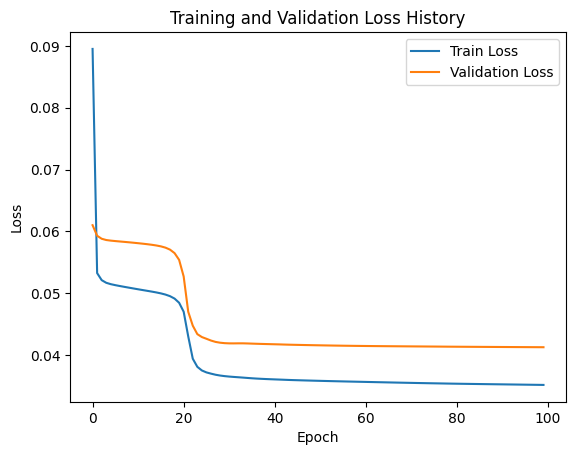

In [ ]:
plt.plot(train_loss_history_SrVAR, label="Train Loss")
plt.plot(val_loss_history_SrVAR, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss History")
plt.legend()
plt.show()

In [ ]:
model_SrVAR.eval() 
predictions_SrVAR = []
batch_size = 32
n_features = 7

with torch.no_grad():
    for i in range(0, len(testX), batch_size):
        batch_x = torch.tensor(testX[i:i+batch_size], dtype=torch.float32)

        batch_pred, _, _, _ = model_SrVAR(batch_x)

        predictions_SrVAR.append(batch_pred.cpu().numpy())

predictions_SrVAR = np.concatenate(predictions_SrVAR, axis=0)

In [ ]:
last_test_values = VAR_test.iloc[p:]
testY_original = reverse_difference(last_test_values, testY)
pred_SrVAR_original = reverse_difference(last_test_values, predictions_SrVAR)

### Model Evaluation
#### Scaled data

In [ ]:
for i in range(n_features):
    print(f'MSE for {VAR_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_SrVAR_original[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY_original, pred_SrVAR_original)}')

MSE for FX: 0.059843033832971536
MSE for VPM: 0.04095515094471116
MSE for PM: 0.023836349250199177
MSE for TMK: 0.014992070130253698
MSE for UPM: 0.107988509492014
MSE for TNK: 0.013881809686024264
MSE for TGK: 0.014860721338260144
MSE total: 0.03947966352491912


In [ ]:
for i in range(n_features):
    print(f'RMSE for {VAR_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_SrVAR_original[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY_original, pred_SrVAR_original, squared=False)}')

RMSE for FX: 0.24462835860335477
RMSE for VPM: 0.20237379016243967
RMSE for PM: 0.15439024985470803
RMSE for TMK: 0.12244210930171735
RMSE for UPM: 0.32861605178690523
RMSE for TNK: 0.11782109185550889
RMSE for TGK: 0.12190455831616857
RMSE total: 0.1845966014115432


In [ ]:
for i in range(n_features):
    print(f'MAE for {VAR_test.columns[i]}: {mean_absolute_error(testY_original[:, i], pred_SrVAR_original[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY_original, pred_SrVAR_original)}')

MAE for FX: 0.1840534656736267
MAE for VPM: 0.12174003460443839
MAE for PM: 0.11782694188206624
MAE for TMK: 0.09435055134400462
MAE for UPM: 0.23463978145264433
MAE for TNK: 0.09023545640135731
MAE for TGK: 0.0934651750204905
MAE total: 0.13375877233980407


In [ ]:
for i in range(n_features):
    print(f'R2 for {VAR_test.columns[i]}: {r2_score(testY_original[:, i], pred_SrVAR_original[:, i])}')
    
print(f'R2 total: {r2_score(testY_original, pred_SrVAR_original)}')

R2 for FX: 0.04019723804963071
R2 for VPM: 0.7981126670356443
R2 for PM: 0.6112246137852743
R2 for TMK: 0.9063864801773839
R2 for UPM: 0.5260490510873252
R2 for TNK: 0.9048335419238585
R2 for TGK: 0.9054216824449896
R2 total: 0.6703178963577299


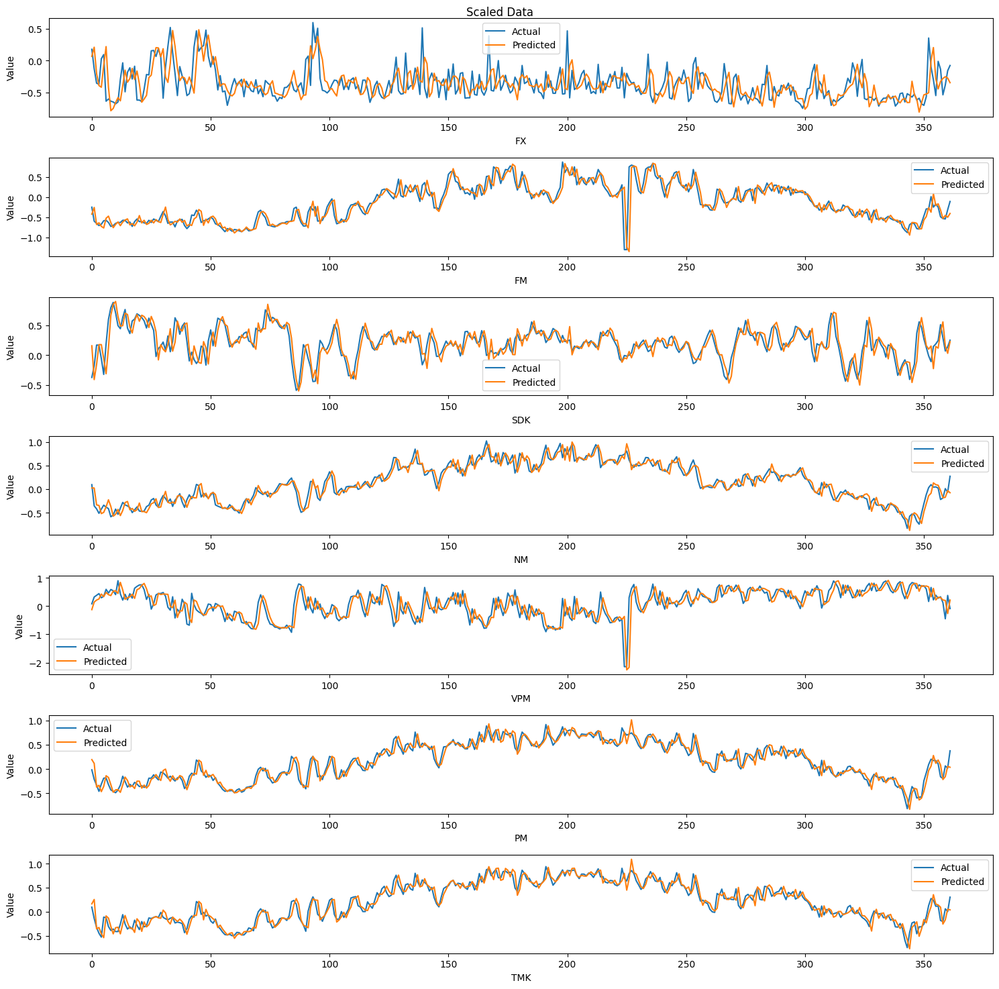

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(testY_original[:, i], label='Actual')
    plt.plot(pred_SrVAR_original[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

#### Unscaled data

In [ ]:
unscaled_SrVAR = unscale(pred_SrVAR_original)
originY = unscale(testY_original)

In [ ]:
for i in range(n_features):
    print(f'MSE for {VAR_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_SrVAR[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_SrVAR)}')

MSE for FX: 17.294636777728776
MSE for VPM: 3.4664439759603525
MSE for PM: 19.293200673984288
MSE for TMK: 5.469257104217854
MSE for UPM: 107.15159854345092
MSE for TNK: 4.202856700540705
MSE for TGK: 4.4734114890464145
MSE total: 23.050200752132756


In [ ]:
for i in range(n_features):
    print(f'RMSE for {VAR_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_SrVAR[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_SrVAR, squared=False)}')

RMSE for FX: 4.1586820962570314
RMSE for VPM: 1.8618388694944448
RMSE for PM: 4.392402608366438
RMSE for TMK: 2.338644287662802
RMSE for UPM: 10.351405631287516
RMSE for TNK: 2.0500869982858543
RMSE for TGK: 2.1150440867855247
RMSE total: 3.8954435111628007


In [ ]:
for i in range(n_features):
    print(f'MAE for {VAR_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_SrVAR[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_SrVAR)}')

MAE for FX: 3.1289089164516537
MAE for VPM: 1.1200083183608331
MAE for PM: 3.3521764965447804
MAE for TMK: 1.8020955306704884
MAE for UPM: 7.3911531157582955
MAE for TNK: 1.5700969413836172
MAE for TGK: 1.6216207866055103
MAE total: 2.855151443682168


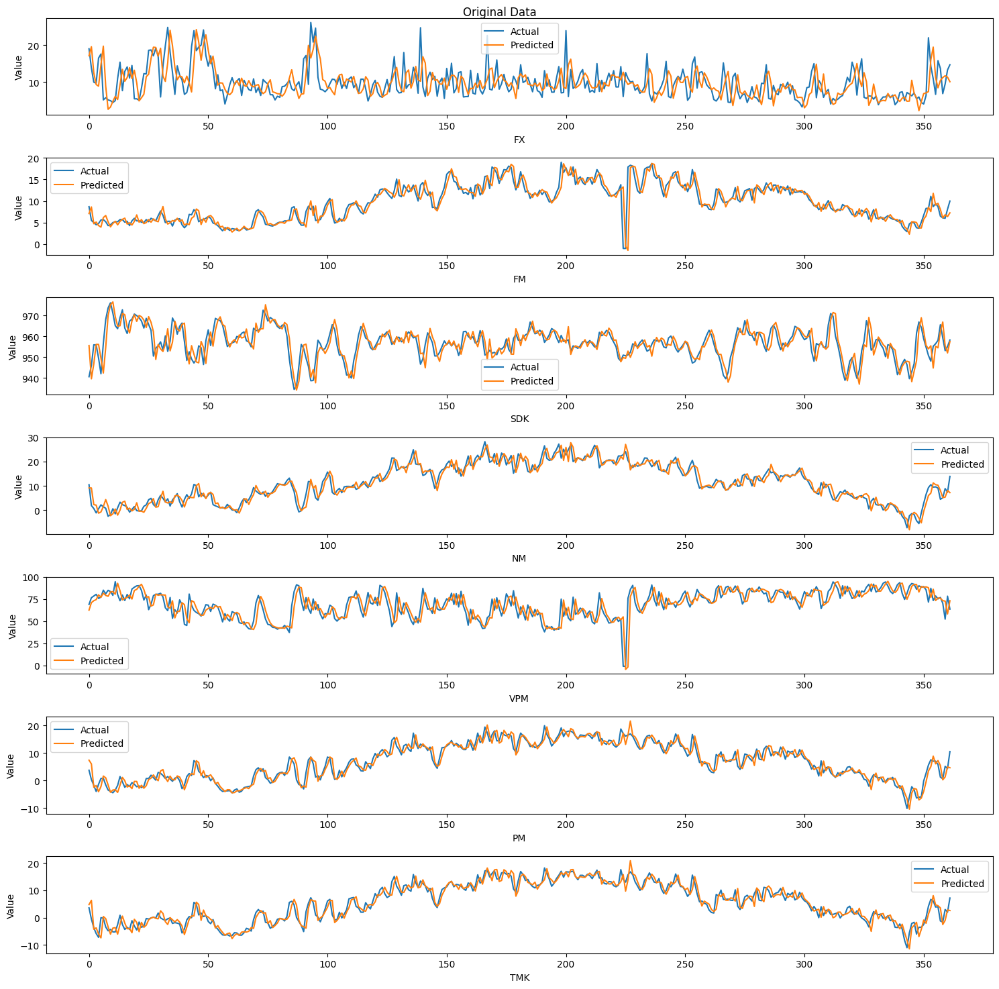

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_SrVAR[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Original Data')
plt.tight_layout()
plt.show()

In [ ]:
torch.save(trained_model_SrVAR.state_dict(), "srvar_model_weather.pth")